<h1 id="pattern_visualization">Level of integration for migrants and refugees throught an unsupervised learning method</h1>

This study is base on the High-Frequency Survey 2021 by UNHCR. After applying the clustering technique, four groups were obtained and classified into three levels of integration.

In [1]:
#pip install plot-likert
#pip install scikit-learn
#pip install kmodes
#pip install missingno

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
import missingno as msno
%matplotlib inline

from sklearn.manifold import TSNE

import warnings
warnings.filterwarnings('ignore')

from matplotlib import pyplot
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform
import plot_likert

import scipy.cluster.hierarchy as shc
import ipywidgets

from kmodes.kmodes import KModes

In [3]:
data = pd.read_csv("UNHCR_ECU_2021_HFS_Q4_v2.1.csv", sep=',',on_bad_lines='skip', index_col=False, dtype='unicode')
data

,CountryOfAsylum,MonitoringDate,shortCBI,remoteorinperson,stafforpartner,interviewstat,relocationprog,nationality,crossedborder,leftresidence,...,RazonFaltaAsistMed_atencionSusp,RazonFaltaAsistMed_FaltaIF,RazonFaltaAsistMed_FaltaInfo,RazonFaltaAsistMed_faltaRecursos,RazonFaltaAsistMed_FaltaSegMed,RazonFaltaAsistMed_lejania,RazonFaltaAsistMed_MiedoArresto,RazonFaltaAsistMed_otroAtMed,Weight,ID
0,Ecuador,2021-04-10,NaN,byphone,socio,complete,NaN,venezuela,yes,NaN,...,0,0,0,0,0,0,0,0,36.0847170450695,1
1,Ecuador,2021-05-17,NaN,byphone,socio,complete,NaN,venezuela,yes,NaN,...,0,0,0,0,0,0,0,0,36.0847170450695,2
2,Ecuador,2021-08-31,NaN,byphone,socio,complete,NaN,venezuela,yes,NaN,...,0,0,0,0,0,0,0,0,36.0847170450695,3
3,Ecuador,2021-11-23,NaN,byphone,socio,complete,NaN,venezuela,yes,NaN,...,0,0,0,0,0,0,0,0,36.0847170450695,4
4,Ecuador,2021-09-04,NaN,byphone,socio,complete,NaN,colombia,yes,NaN,...,0,0,0,0,0,0,0,0,36.0847170450695,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3945,Ecuador,2021-06-19,NaN,byphone,socio,complete,NaN,venezuela,yes,NaN,...,0,0,0,0,0,0,0,0,36.0847170450695,3946
3946,Ecuador,2021-05-25,NaN,byphone,socio,complete,NaN,venezuela,yes,NaN,...,0,0,0,0,0,0,0,0,36.0847170450695,3947
3947,Ecuador,2021-11-25,NaN,byphone,socio,complete,NaN,colombia,yes,NaN,...,0,0,0,0,0,0,0,0,36.0847170450695,3948
3948,Ecuador,2021-04-07,NaN,byphone,socio,complete,NaN,venezuela,yes,NaN,...,0,0,0,0,0,0,0,0,36.0847170450695,3949


<Axes: >

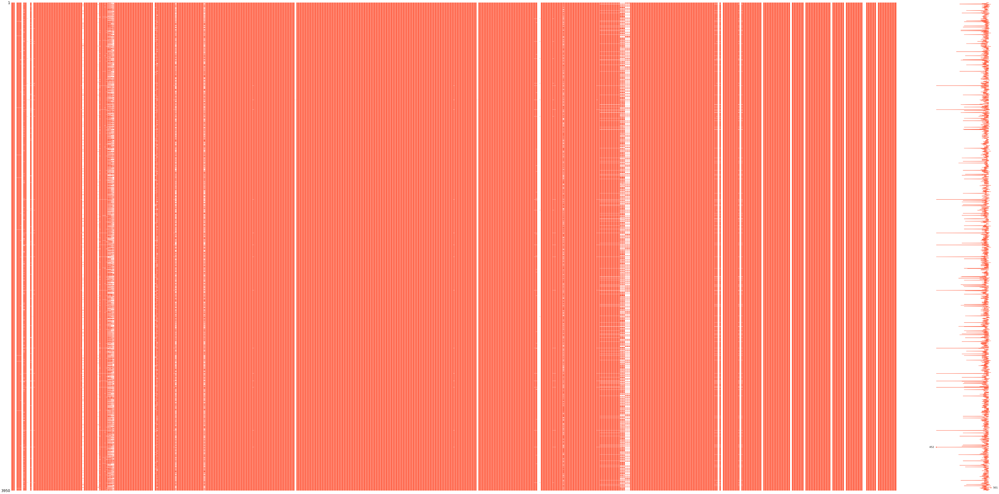

In [4]:
msno.matrix(data,figsize=(100,50), color=(1, 0.38, 0.27))

In [5]:
#Elimina las columnas que tiene NaN en todas las filas
data.dropna(axis=1, how='all',inplace=True)
data.dtypes

CountryOfAsylum                    object
MonitoringDate                     object
remoteorinperson                   object
stafforpartner                     object
interviewstat                      object
                                    ...  
RazonFaltaAsistMed_lejania         object
RazonFaltaAsistMed_MiedoArresto    object
RazonFaltaAsistMed_otroAtMed       object
Weight                             object
ID                                 object
Length: 510, dtype: object

In [6]:
#Renombre de columnas
data = data.rename(columns={'MonitoringDate': 'Fecha','TransportMethod_boat': 'TransBote', 'TransportMethod_bus': 'TransBus',
                            'TransportMethod_car': 'TransAuto', 'TransportMethod_hitchHiking': 'TransSendero', 
                            'TransportMethod_other': 'TransOtro', 'TransportMethod_plane': 'TransAvion', 
                            'TransportMethod_taxi': 'TransTaxi','nationality':'nacionalidad',
                            'crossedborder':'DejaPais','DepartureDate':'FechaSalePais','ArriveThiscountry':'FechaLlegaEC',
                            'intentionmove':'intencionmudarse','Intention':'iradonde','intentionspctr':'acualpais',
                            'reasonsreturn_discrim':'razonretorno_discrim','reasonsreturn_familyleft':'razonretorno_cercafamilia',
                            'reasonsreturn_houseloss':'razonretorno_desalojo','reasonsreturn_jobloss':'razonretorno_trabajo',
                            'reasonsreturn_nodocs':'razonretorno_sindocs','reasonsreturn_nomeds':'razonretorno_sinmeds',
                            'reasonsreturn_other':'razonretorno_otra','reasonsreturn_violence':'razonretorno_violencia',
                            'groupsize':'grupotam','TotalAdultFemale':'TotalMujer','TotalAdultMale':'TotalHombre',
                            'TotalMinor':'TotalMenores','TotalMinorFemale':'TotalNinas','TotalMinorMale':'TotalNinos',
                            'Childinschool':'NinosEscuela','Childvirtualed':'NinosClasesVirtuales',
                            'Childwhynotschool_childwork':'NoAsiste_TrabajoInfantil','Childwhynotschool_disability':'NoAsiste_Discapacidad',
                            'Childwhynotschool_discrimnation':'NoAsiste_Discriminacion','Childwhynotschool_disease':'NoAsiste_Enfermedad',
                            'Childwhynotschool_failedschool':'NoAsiste_FracasoEscuela','Childwhynotschool_fearschool':'NoAsiste_MiedoEscuela',
                            'Childwhynotschool_finished':'EscuelaTermino','Childwhynotschool_helphome':'NoAsiste_AyudaEnCasa',
                            'Childwhynotschool_intransit':'NoAsiste_EnTransito','Childwhynotschool_nodocs':'NoAsiste_SinDocumentos',
                            'Childwhynotschool_noinfo':'NoAsiste_FaltaInformacion','Childwhynotschool_nointerest':'NoAsiste_NoInteresa',
                            'Childwhynotschool_nomoney':'NoAsiste_NoTieneDinero','Childwhynotschool_noschools':'NoAsiste_NoHayEscuelas',
                            'Childwhynotschool_nospot':'NoAsiste_FaltaCupos','Childwhynotschool_notransport':'NoAsiste_NoTransporte',
                            'Childwhynotschool_other':'NoAsiste_OtrasRazones','Childwhynotschool_pregnancy':'NoAsiste_Embarazo',
                            'Childwhynotschool_recentlyarrive':'NoAsiste_RecienLlegado','Childwhynotschool_toolate':'NoAsiste_InscribeTarde',
                            'householdLeftbehind':'DejarFamiliares',
                            'RouteIncident':'TestigoIncidentes','RouteIncidentType_abduction':'Incidente_Secuestro',
                            'RouteIncidentType_arrest':'Incidente_DetencionIlegal','RouteIncidentType_bribery':'Incidente_SobornoFuncionarios',
                            'RouteIncidentType_deportation':'Incidente_Deportacion','RouteIncidentType_destructProp':'Incidente_DestruccionPropiedad',
                            'RouteIncidentType_eviction':'Incidente_Desalojo','RouteIncidentType_evictionthreat':'Incidente_AmenazaDesalojo',
                            'RouteIncidentType_Exploitsex':'Incidente_ExplotacionSexual','RouteIncidentType_Exploitwork':'Incidente_ExplotacionLaboral',
                            'RouteIncidentType_fraud':'Incidente_Estafa','RouteIncidentType_homicide':'Incidente_Homicidio',
                            'RouteIncidentType_notell':'Incidente_PrefiereNoDecir','RouteIncidentType_other':'Incidente_Otro',
                            'RouteIncidentType_physAssault':'Incidente_AgresionFisica','RouteIncidentType_sexualAssault':'Incidente_AgresionSexual',
                            'RouteIncidentType_theft':'Incidente_Robo','RouteIncidentType_threat':'Incidente_Intimidacion',
                            'RiskYes':'RiesgoSiNo','FeelSafe':'SentirSeguro','Isolation':'Aislamiento','Discriminated':'Discriminacion',
                            'Interaction':'Interaccion','communication':'Internet',
                            'RiskReturn_armedgroup':'Riesgo_GrupoArmado','RiskReturn_assaulted':'Riesgo_PerseguidosAgresion',
                            'RiskReturn_extorsion':'Riesgo_Extorsion','RiskReturn_healthrisk':'Riesgo_Salud','RiskReturn_insecurity':'Riesgo_InseguridadPais',
                            'RiskReturn_lackfood':'Riesgo_FaltaAlimento','RiskReturn_medical':'Riesgo_NoHayAccesoServMedicos',
                            'RiskReturn_other':'Riesgo_Otros','RiskReturn_recruited':'Riesgo_ReclutadoGruposCriminales',
                            'RiskReturn_riskPreferNot':'Riesgo_PrefiereNoDecirlo','RiskReturn_subsistence':'Riesgo_NoConseguiriaTrabajo',
                            'RiskReturn_threat':'Riesgo_AmenazaFisica','RiskReturn_violence':'Riesgo_MiedoInseguridadViolencia',
                            'documentation_birthcertif':'Docs_CertNacimiento','documentation_id':'Docs_DocumentoID','documentation_idexp':'Docs_IDExpirado',
                            'documentation_none':'Docs_Ninguno','documentation_other':'Docs_Otro','documentation_passport':'Docs_PasaporteValido',
                            'documentation_passportexp':'Docs_PasaporteExpirado',
                            'RegularEntry':'EntradaRegular','AppliedRefugee':'IntencionAsilo','NotAsylum_costs':'NoAplicaAsilo_Costo',
                            'NotAsylum_distance':'NoAplicaAsilo_CentroSaludMuyLejos','NotAsylum_lack_of_docume':'NoAplicaAsilo_FaltaDocs',
                            'NotAsylum_lack_of_inform':'NoAplicaAsilo_FaltaInformacion','NotAsylum_lack_time':'NoAplicaAsilo_FaltaTiempo',
                            'NotAsylum_not_allowed_in':'NoAplicaAsilo_NoPermitidoEnPais','NotAsylum_other':'NoAplicaAsilo_Otro',
                            'docResidence':'DocsResidencia',
                            'housingtype':'tipovivienda','water':'agua','bathroom':'sanitario','electricity':'electricidad',
                            'mealsperday':'comidapordia'})

In [7]:
#Renombre de elementos de columnas
data['RiesgoSiNo'].  replace({'Agree':'DeAcuerdo', 'Disagree':'EnDesacuerdo', 'StronglyAgree':'TotalmenteDeAcuerdo',
                                         'StronglyDisagree':'TotalmenteEnDesacuerdo', 'Undecided':'Indeciso'},inplace=True)
data['SentirSeguro'].replace({'Agree':'DeAcuerdo', 'Disagree':'EnDesacuerdo', 'StronglyAgree':'TotalmenteDeAcuerdo',
                                         'StronglyDisagree':'TotalmenteEnDesacuerdo', 'Undecided':'Indeciso'},inplace=True)
data['Aislamiento']. replace({'Agree':'DeAcuerdo', 'Disagree':'EnDesacuerdo', 'StronglyAgree':'TotalmenteDeAcuerdo',
                                         'StronglyDisagree':'TotalmenteEnDesacuerdo', 'Undecided':'Indeciso'},inplace=True)
data['Discriminacion']. replace({'Agree':'DeAcuerdo', 'Disagree':'EnDesacuerdo', 'StronglyAgree':'TotalmenteDeAcuerdo',
                                         'StronglyDisagree':'TotalmenteEnDesacuerdo', 'Undecided':'Indeciso'},inplace=True)
data['Interaccion']. replace({'positive':'DeAcuerdo', 'negative':'EnDesacuerdo', 'verypositive':'TotalmenteDeAcuerdo',
                               'verynegative':'TotalmenteEnDesacuerdo','neutral':'Indeciso'},inplace=True)
data['Internet']. replace({'easy':'DeAcuerdo', 'difficult':'EnDesacuerdo', 'veryeasy':'TotalmenteDeAcuerdo',
                               'verydifficult':'TotalmenteEnDesacuerdo','neutral':'Indeciso'},inplace=True)
data['EntradaRegular'].replace({'yes':'si','notell':'nolodice','remainCountry':'permanecepais'},inplace=True)
data['DocsResidencia'].replace({'notell':'nolodice','permit':'permiso','visahumanitarian':'visahumanitaria',
                                'visapending':'visapendiente','visaresidenceperm':'visaresidenciaperm',
                                'visaresidencetemp':'visaresidenciatemp','visatourist':'visaturista'},inplace=True)
data['ethnicity'].replace({'mixed':'mixta', 'black':'negro', 'white':'blanco','other':'otro', 'indigenous':'indigena'},inplace=True)
data['FamiliyLeft'].replace({'yes':'si', 'notell':'nodice', 'dontknow':'nosabe'},inplace=True)

In [8]:
#conversion a valores enteros
pd.options.mode.copy_on_write = True
data[['TransBote','TransBus','TransAuto','TransSendero','TransOtro','TransAvion','TransTaxi']] = data[['TransBote',
      'TransBus','TransAuto','TransSendero','TransOtro','TransAvion','TransTaxi']].astype(float)
data[['razonretorno_discrim','razonretorno_cercafamilia','razonretorno_desalojo','razonretorno_trabajo',
      'razonretorno_sindocs','razonretorno_sinmeds','razonretorno_otra','razonretorno_violencia']]=data[['razonretorno_discrim',
      'razonretorno_cercafamilia','razonretorno_desalojo','razonretorno_trabajo','razonretorno_sindocs',
      'razonretorno_sinmeds','razonretorno_otra','razonretorno_violencia']].astype(float)
data[['grupotam','TotalAdult','TotalMujer','TotalHombre','TotalMenores','TotalNinas','TotalNinos']]=data[['grupotam',
      'TotalAdult','TotalMujer','TotalHombre','TotalMenores','TotalNinas','TotalNinos']].astype(float)
data[['NoAsiste_TrabajoInfantil','NoAsiste_Discapacidad','NoAsiste_Discriminacion','NoAsiste_Enfermedad',
      'NoAsiste_FracasoEscuela','NoAsiste_MiedoEscuela','EscuelaTermino','NoAsiste_AyudaEnCasa',
      'NoAsiste_EnTransito','NoAsiste_SinDocumentos','NoAsiste_FaltaInformacion','NoAsiste_NoInteresa',
      'NoAsiste_NoTieneDinero','NoAsiste_NoHayEscuelas','NoAsiste_FaltaCupos','NoAsiste_NoTransporte',
      'NoAsiste_OtrasRazones','NoAsiste_Embarazo','NoAsiste_RecienLlegado','NoAsiste_InscribeTarde']]=data[['NoAsiste_TrabajoInfantil',
      'NoAsiste_Discapacidad','NoAsiste_Discriminacion','NoAsiste_Enfermedad','NoAsiste_FracasoEscuela',
      'NoAsiste_MiedoEscuela','EscuelaTermino','NoAsiste_AyudaEnCasa','NoAsiste_EnTransito','NoAsiste_SinDocumentos',
      'NoAsiste_FaltaInformacion','NoAsiste_NoInteresa','NoAsiste_NoTieneDinero','NoAsiste_NoHayEscuelas',
      'NoAsiste_FaltaCupos','NoAsiste_NoTransporte','NoAsiste_OtrasRazones','NoAsiste_Embarazo','NoAsiste_RecienLlegado',
      'NoAsiste_InscribeTarde']].astype(int)
data[['Riesgo_GrupoArmado','Riesgo_PerseguidosAgresion','Riesgo_Extorsion','Riesgo_Salud','Riesgo_InseguridadPais',
      'Riesgo_FaltaAlimento','Riesgo_NoHayAccesoServMedicos','Riesgo_Otros','Riesgo_ReclutadoGruposCriminales',
      'Riesgo_PrefiereNoDecirlo','Riesgo_NoConseguiriaTrabajo','Riesgo_AmenazaFisica',
      'Riesgo_MiedoInseguridadViolencia']]=data[['Riesgo_GrupoArmado','Riesgo_PerseguidosAgresion','Riesgo_Extorsion',
      'Riesgo_Salud','Riesgo_InseguridadPais','Riesgo_FaltaAlimento','Riesgo_NoHayAccesoServMedicos','Riesgo_Otros',
      'Riesgo_ReclutadoGruposCriminales','Riesgo_PrefiereNoDecirlo','Riesgo_NoConseguiriaTrabajo','Riesgo_AmenazaFisica',
      'Riesgo_MiedoInseguridadViolencia']].astype(int)
data[['Docs_CertNacimiento','Docs_DocumentoID','Docs_IDExpirado','Docs_Ninguno','Docs_Otro','Docs_PasaporteValido',
      'Docs_PasaporteExpirado']]=data[['Docs_CertNacimiento','Docs_DocumentoID','Docs_IDExpirado','Docs_Ninguno','Docs_Otro','Docs_PasaporteValido',
      'Docs_PasaporteExpirado']].astype(int)
data[['NoAplicaAsilo_Costo','NoAplicaAsilo_CentroSaludMuyLejos','NoAplicaAsilo_FaltaDocs','NoAplicaAsilo_FaltaInformacion',
      'NoAplicaAsilo_FaltaTiempo','NoAplicaAsilo_NoPermitidoEnPais','NoAplicaAsilo_Otro']]=data[['NoAplicaAsilo_Costo',
      'NoAplicaAsilo_CentroSaludMuyLejos','NoAplicaAsilo_FaltaDocs','NoAplicaAsilo_FaltaInformacion','NoAplicaAsilo_FaltaTiempo',
      'NoAplicaAsilo_NoPermitidoEnPais','NoAplicaAsilo_Otro']].astype(int)

<h2 id="pattern_visualization">Eliminación de filas con datos NULL</h2>

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3950 entries, 0 to 3949
Columns: 510 entries, CountryOfAsylum to ID
dtypes: float64(22), int32(47), object(441)
memory usage: 14.7+ MB


In [10]:
#Identifica filas con grupo familiar con datos atípicos y filas con datos vacíos repetitivos
print(data['grupotam'].loc[[787,1579,2105,3435]])

787      3.0
1579    17.0
2105    23.0
3435    15.0
Name: grupotam, dtype: float64


In [11]:
data = data.drop([787,1579,2105,3435])

In [12]:
#Identifica variables NULL en columna tipovivienda
print(data['tipovivienda'].isnull().sum())

113


In [13]:
data = data.dropna(subset=['tipovivienda'])

In [14]:
print(data['Aislamiento'].isnull().sum())

7


In [15]:
data = data.dropna(subset=['Aislamiento'])

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3826 entries, 0 to 3949
Columns: 510 entries, CountryOfAsylum to ID
dtypes: float64(22), int32(47), object(441)
memory usage: 14.2+ MB


<Axes: >

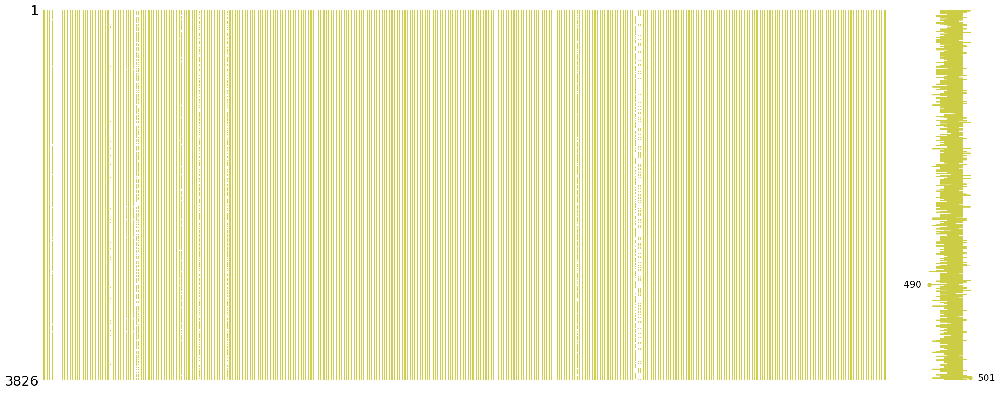

In [17]:
msno.matrix(data, color=(0.8, 0.8, 0.27))

<h2 id="pattern_visualization">Variables de respuestas múltiples</h2>

<h4 id="pattern_visualization">grupotam</h4>

In [18]:
data[['grupotam','TotalAdult','TotalMujer','TotalHombre','TotalMenores','TotalNinas','TotalNinos']]=data[['grupotam',
      'TotalAdult','TotalMujer','TotalHombre','TotalMenores','TotalNinas','TotalNinos']].fillna(0).astype(int)
numdependiente = data[['grupotam','TotalAdult','TotalMujer','TotalHombre','TotalMenores','TotalNinas','TotalNinos']].astype(int)

In [19]:
numdependiente['TotalHombre'] = np.where(numdependiente['TotalMujer'] + numdependiente['TotalHombre'] + numdependiente['TotalNinas'] + 
                                       numdependiente['TotalNinos'] == 0,1,numdependiente['TotalHombre'])

In [20]:
numdependiente.TotalAdult   = numdependiente.TotalHombre + numdependiente.TotalMujer
numdependiente.TotalMenores = numdependiente.TotalNinos  + numdependiente.TotalNinas
numdependiente.grupotam     = numdependiente.TotalAdult  + numdependiente.TotalMenores

In [21]:
numdependiente.sum()

grupotam        14203
TotalAdult       8427
TotalMujer       4872
TotalHombre      3555
TotalMenores     5776
TotalNinas       2846
TotalNinos       2930
dtype: int64

Text(0.5, 1.0, 'Número de personas dependientes')

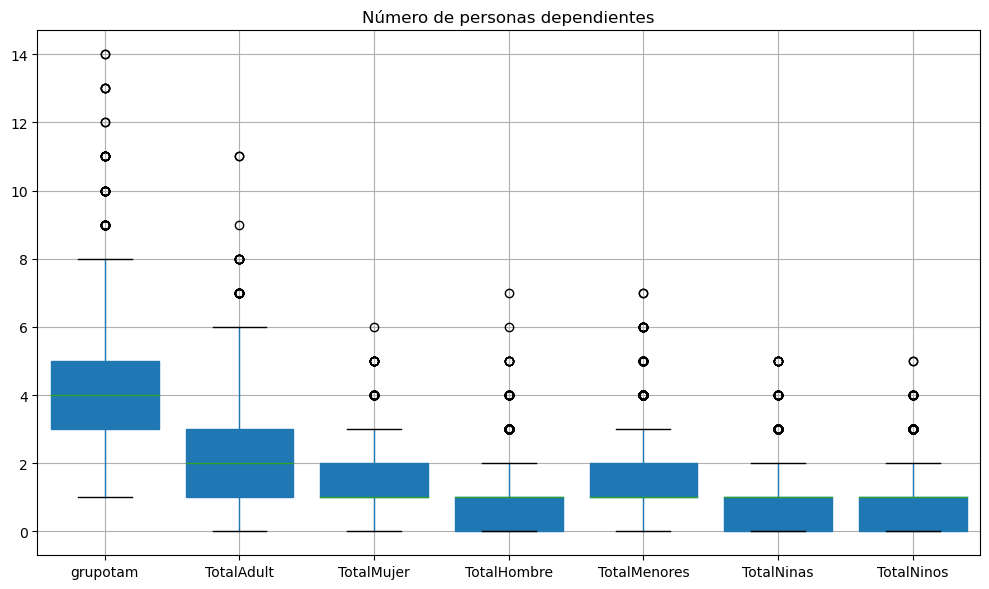

In [22]:
plt.rcParams["figure.figsize"] = [10, 6]
plt.rcParams["figure.autolayout"] = True
b_plot = numdependiente.boxplot(widths = 0.8, patch_artist = True)
b_plot.plot()

mpl.pyplot.title("Número de personas dependientes")

In [23]:
numdependiente["grupotam"].value_counts().to_frame()

,grupotam
3,970
4,887
2,581
5,561
1,335
6,260
7,111
8,57
9,27
10,16


In [24]:
df=numdependiente[["grupotam"]]

In [25]:
etiqueta = ['1 pax', '2 pax', '3 pax', '4 pax', '5 pax', '6 o más pax']
col = pd.cut(df['grupotam'], bins=[0, 1, 2, 3, 4, 5, 25], labels = etiqueta)

<h4 id="pattern_visualization">Menores</h4>

In [26]:
numdependiente["TotalMenores"].value_counts().to_frame()

,TotalMenores
1,1258
2,1053
0,815
3,477
4,156
5,47
6,18
7,2


In [27]:
df['TotalMenores'] = numdependiente[["TotalMenores"]]

<h4 id="pattern_visualization">Escuela_NoAsiste</h4>

In [28]:
asisteclases = data[['NoAsiste_TrabajoInfantil','NoAsiste_Discapacidad','NoAsiste_Discriminacion','NoAsiste_Enfermedad',
                     'NoAsiste_FracasoEscuela','NoAsiste_MiedoEscuela','NoAsiste_AyudaEnCasa','NoAsiste_EnTransito',
                     'NoAsiste_SinDocumentos','NoAsiste_FaltaInformacion','NoAsiste_NoInteresa','NoAsiste_NoTieneDinero',
                     'NoAsiste_NoHayEscuelas','NoAsiste_FaltaCupos','NoAsiste_NoTransporte','NoAsiste_OtrasRazones',
                     'NoAsiste_Embarazo','NoAsiste_RecienLlegado','NoAsiste_InscribeTarde']].astype(int)

In [29]:
asisteclases['NoAsiste_Total']=asisteclases.sum(axis=1)
asisteclases

,NoAsiste_TrabajoInfantil,NoAsiste_Discapacidad,NoAsiste_Discriminacion,NoAsiste_Enfermedad,NoAsiste_FracasoEscuela,NoAsiste_MiedoEscuela,NoAsiste_AyudaEnCasa,NoAsiste_EnTransito,NoAsiste_SinDocumentos,NoAsiste_FaltaInformacion,NoAsiste_NoInteresa,NoAsiste_NoTieneDinero,NoAsiste_NoHayEscuelas,NoAsiste_FaltaCupos,NoAsiste_NoTransporte,NoAsiste_OtrasRazones,NoAsiste_Embarazo,NoAsiste_RecienLlegado,NoAsiste_InscribeTarde,NoAsiste_Total
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3945,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3946,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
3947,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3948,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,2


In [30]:
asisteclases["NoAsiste_Total"].value_counts().to_frame()

,NoAsiste_Total
0,3302
1,357
2,124
3,31
4,6
5,4
6,2


In [31]:
df['Escuela_NoAsiste'] = asisteclases["NoAsiste_Total"]

In [32]:
asisteclases

,NoAsiste_TrabajoInfantil,NoAsiste_Discapacidad,NoAsiste_Discriminacion,NoAsiste_Enfermedad,NoAsiste_FracasoEscuela,NoAsiste_MiedoEscuela,NoAsiste_AyudaEnCasa,NoAsiste_EnTransito,NoAsiste_SinDocumentos,NoAsiste_FaltaInformacion,NoAsiste_NoInteresa,NoAsiste_NoTieneDinero,NoAsiste_NoHayEscuelas,NoAsiste_FaltaCupos,NoAsiste_NoTransporte,NoAsiste_OtrasRazones,NoAsiste_Embarazo,NoAsiste_RecienLlegado,NoAsiste_InscribeTarde,NoAsiste_Total
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3945,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3946,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
3947,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3948,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,2


In [33]:
asisteclases['NoAsiste_RecienLlegado']     = np.where((asisteclases['NoAsiste_RecienLlegado']    + asisteclases['NoAsiste_SinDocumentos']    > 1), 0 , asisteclases['NoAsiste_RecienLlegado'])
asisteclases['NoAsiste_RecienLlegado']     = np.where((asisteclases['NoAsiste_RecienLlegado']    + asisteclases['NoAsiste_InscribeTarde']    > 1), 0 , asisteclases['NoAsiste_RecienLlegado'])
asisteclases['NoAsiste_OtrasRazones']      = np.where((asisteclases['NoAsiste_RecienLlegado']    + asisteclases['NoAsiste_OtrasRazones']     > 1), 0 , asisteclases['NoAsiste_OtrasRazones'])
asisteclases['NoAsiste_FaltaInformacion']  = np.where((asisteclases['NoAsiste_FaltaInformacion'] + asisteclases['NoAsiste_NoTieneDinero']    > 1), 0 , asisteclases['NoAsiste_FaltaInformacion'])
asisteclases['NoAsiste_OtrasRazones']      = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_OtrasRazones']     > 1), 0 , asisteclases['NoAsiste_OtrasRazones'])
asisteclases['NoAsiste_SinDocumentos']     = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_SinDocumentos']    > 1), 0 , asisteclases['NoAsiste_SinDocumentos'])
asisteclases['NoAsiste_OtrasRazones']      = np.where((asisteclases['NoAsiste_SinDocumentos']    + asisteclases['NoAsiste_OtrasRazones']     > 1), 0 , asisteclases['NoAsiste_OtrasRazones'])
asisteclases['NoAsiste_Enfermedad']        = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_Enfermedad']       > 1), 0 , asisteclases['NoAsiste_Enfermedad'])
asisteclases['NoAsiste_FaltaCupos']        = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_FaltaCupos']       > 1), 0 , asisteclases['NoAsiste_FaltaCupos'])
asisteclases['NoAsiste_FaltaInformacion']  = np.where((asisteclases['NoAsiste_FaltaInformacion'] + asisteclases['NoAsiste_InscribeTarde']    > 1), 0 , asisteclases['NoAsiste_FaltaInformacion'])
asisteclases['NoAsiste_InscribeTarde']     = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_InscribeTarde']    > 1), 0 , asisteclases['NoAsiste_InscribeTarde'])
asisteclases['NoAsiste_AyudaEnCasa']       = np.where((asisteclases['NoAsiste_TrabajoInfantil']  + asisteclases['NoAsiste_AyudaEnCasa']      > 1), 0 , asisteclases['NoAsiste_AyudaEnCasa'])
asisteclases['NoAsiste_InscribeTarde']     = np.where((asisteclases['NoAsiste_FaltaCupos']       + asisteclases['NoAsiste_InscribeTarde']    > 1), 0 , asisteclases['NoAsiste_InscribeTarde'])
asisteclases['NoAsiste_Embarazo']          = np.where((asisteclases['NoAsiste_InscribeTarde']    + asisteclases['NoAsiste_Embarazo']         > 1), 0 , asisteclases['NoAsiste_Embarazo'])
asisteclases['NoAsiste_Embarazo']          = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_Embarazo']         > 1), 0 , asisteclases['NoAsiste_Embarazo'])
asisteclases['NoAsiste_OtrasRazones']      = np.where((asisteclases['NoAsiste_InscribeTarde']    + asisteclases['NoAsiste_OtrasRazones']     > 1), 0 , asisteclases['NoAsiste_OtrasRazones'])
asisteclases['NoAsiste_FaltaInformacion']  = np.where((asisteclases['NoAsiste_SinDocumentos']    + asisteclases['NoAsiste_FaltaInformacion'] > 1), 0 , asisteclases['NoAsiste_FaltaInformacion'])
asisteclases['NoAsiste_RecienLlegado']     = np.where((asisteclases['NoAsiste_FaltaCupos']       + asisteclases['NoAsiste_RecienLlegado']    > 1), 0 , asisteclases['NoAsiste_RecienLlegado'])
asisteclases['NoAsiste_FracasoEscuela']    = np.where((asisteclases['NoAsiste_InscribeTarde']    + asisteclases['NoAsiste_FracasoEscuela']   > 1), 0 , asisteclases['NoAsiste_FracasoEscuela'])
asisteclases['NoAsiste_InscribeTarde']     = np.where((asisteclases['NoAsiste_SinDocumentos']    + asisteclases['NoAsiste_InscribeTarde']    > 1), 0 , asisteclases['NoAsiste_InscribeTarde'])
asisteclases['NoAsiste_OtrasRazones']      = np.where((asisteclases['NoAsiste_NoHayEscuelas']    + asisteclases['NoAsiste_OtrasRazones']     > 1), 0 , asisteclases['NoAsiste_OtrasRazones'])
asisteclases['NoAsiste_EnTransito']        = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_EnTransito']       > 1), 0 , asisteclases['NoAsiste_EnTransito'])
asisteclases['NoAsiste_Discriminacion']    = np.where((asisteclases['NoAsiste_SinDocumentos']    + asisteclases['NoAsiste_Discriminacion']   > 1), 0 , asisteclases['NoAsiste_Discriminacion'])
asisteclases['NoAsiste_FaltaCupos']        = np.where((asisteclases['NoAsiste_SinDocumentos']    + asisteclases['NoAsiste_FaltaCupos']       > 1), 0 , asisteclases['NoAsiste_FaltaCupos'])
asisteclases['NoAsiste_MiedoEscuela']      = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_MiedoEscuela']     > 1), 0 , asisteclases['NoAsiste_MiedoEscuela'])
asisteclases['NoAsiste_RecienLlegado']     = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_RecienLlegado']    > 1), 0 , asisteclases['NoAsiste_RecienLlegado'])
asisteclases['NoAsiste_EnTransito']        = np.where((asisteclases['NoAsiste_RecienLlegado']    + asisteclases['NoAsiste_EnTransito']       > 1), 0 , asisteclases['NoAsiste_EnTransito'])
asisteclases['NoAsiste_FracasoEscuela']    = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_FracasoEscuela']   > 1), 0 , asisteclases['NoAsiste_FracasoEscuela'])
asisteclases['NoAsiste_RecienLlegado']     = np.where((asisteclases['NoAsiste_FaltaInformacion'] + asisteclases['NoAsiste_RecienLlegado']    > 1), 0 , asisteclases['NoAsiste_RecienLlegado'])
asisteclases['NoAsiste_NoHayEscuelas']     = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_NoHayEscuelas']    > 1), 0 , asisteclases['NoAsiste_NoHayEscuelas'])
asisteclases['NoAsiste_Discapacidad']      = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_Discapacidad']     > 1), 0 , asisteclases['NoAsiste_Discapacidad'])
#asisteclases['EscuelaTermino']             = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['EscuelaTermino']            > 1), 0 , asisteclases['EscuelaTermino'])
asisteclases['NoAsiste_FaltaCupos']        = np.where((asisteclases['NoAsiste_FaltaInformacion'] + asisteclases['NoAsiste_FaltaCupos']       > 1), 0 , asisteclases['NoAsiste_FaltaCupos'])
asisteclases['NoAsiste_FaltaInformacion']  = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_FaltaInformacion'] > 1), 0 , asisteclases['NoAsiste_FaltaInformacion'])
asisteclases['NoAsiste_Discriminacion']    = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_Discriminacion']   > 1), 0 , asisteclases['NoAsiste_Discriminacion'])
asisteclases['NoAsiste_OtrasRazones']      = np.where((asisteclases['NoAsiste_FaltaCupos']       + asisteclases['NoAsiste_OtrasRazones']     > 1), 0 , asisteclases['NoAsiste_OtrasRazones'])
asisteclases['NoAsiste_NoTransporte']      = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_NoTransporte']     > 1), 0 , asisteclases['NoAsiste_NoTransporte'])
asisteclases['NoAsiste_FaltaCupos']        = np.where((asisteclases['NoAsiste_FaltaInformacion'] + asisteclases['NoAsiste_FaltaCupos']       > 1), 0 , asisteclases['NoAsiste_FaltaCupos'])
asisteclases['NoAsiste_NoHayEscuelas']     = np.where((asisteclases['NoAsiste_FaltaInformacion'] + asisteclases['NoAsiste_NoHayEscuelas']    > 1), 0 , asisteclases['NoAsiste_NoHayEscuelas'])
asisteclases['NoAsiste_OtrasRazones']      = np.where((asisteclases['NoAsiste_FaltaInformacion'] + asisteclases['NoAsiste_OtrasRazones']     > 1), 0 , asisteclases['NoAsiste_OtrasRazones'])
asisteclases['NoAsiste_TrabajoInfantil']   = np.where((asisteclases['NoAsiste_NoTieneDinero']    + asisteclases['NoAsiste_TrabajoInfantil']  > 1), 0 , asisteclases['NoAsiste_TrabajoInfantil'])

In [34]:
asisteclases = asisteclases.drop('NoAsiste_Total',axis=1)
asisteclases

,NoAsiste_TrabajoInfantil,NoAsiste_Discapacidad,NoAsiste_Discriminacion,NoAsiste_Enfermedad,NoAsiste_FracasoEscuela,NoAsiste_MiedoEscuela,NoAsiste_AyudaEnCasa,NoAsiste_EnTransito,NoAsiste_SinDocumentos,NoAsiste_FaltaInformacion,NoAsiste_NoInteresa,NoAsiste_NoTieneDinero,NoAsiste_NoHayEscuelas,NoAsiste_FaltaCupos,NoAsiste_NoTransporte,NoAsiste_OtrasRazones,NoAsiste_Embarazo,NoAsiste_RecienLlegado,NoAsiste_InscribeTarde
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3945,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3946,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
3947,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3948,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [35]:
asisteclases['SiAsiste_escuela'] = 0
asisteclases['SiAsiste_virtual'] = 0
asisteclases['NoAsiste_NoResponde'] = 0
asisteclases['SiAsiste_escuela'] = np.where(data['NinosEscuela']=='yes',1,0)
asisteclases['SiAsiste_escuela'] = np.where(data['NinosClasesVirtuales']=='yes',0,asisteclases['SiAsiste_escuela'])
asisteclases['SiAsiste_virtual'] = np.where(data['NinosClasesVirtuales']=='yes',1,0)
#asisteclases.drop(['NinosEscuela','NinosClasesVirtuales'],axis=1, inplace=True)
asisteclases['NoAsiste_NoResponde'] = np.where(asisteclases.sum(axis=1) > 0, 0 , 1)
asisteclases

,NoAsiste_TrabajoInfantil,NoAsiste_Discapacidad,NoAsiste_Discriminacion,NoAsiste_Enfermedad,NoAsiste_FracasoEscuela,NoAsiste_MiedoEscuela,NoAsiste_AyudaEnCasa,NoAsiste_EnTransito,NoAsiste_SinDocumentos,NoAsiste_FaltaInformacion,...,NoAsiste_NoHayEscuelas,NoAsiste_FaltaCupos,NoAsiste_NoTransporte,NoAsiste_OtrasRazones,NoAsiste_Embarazo,NoAsiste_RecienLlegado,NoAsiste_InscribeTarde,SiAsiste_escuela,SiAsiste_virtual,NoAsiste_NoResponde
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3945,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3946,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3947,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3948,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [36]:
Razones_grupo=asisteclases[['SiAsiste_escuela','SiAsiste_virtual']]
Razones_grupo['NoResponde'] = np.where(asisteclases['NoAsiste_NoResponde'] + data['EscuelaTermino']>0, 
                                       1,asisteclases['NoAsiste_NoResponde'])
Razones_grupo['NoAsiste_Economicas'] = np.where(asisteclases['NoAsiste_NoTieneDinero'] + asisteclases['NoAsiste_TrabajoInfantil']>0, 
                                                1,asisteclases['NoAsiste_NoTieneDinero'])
Razones_grupo['NoAsiste_DefMigratoria'] = asisteclases[['NoAsiste_SinDocumentos']]
Razones_grupo['NoAsiste_DefInformativa'] = np.where(asisteclases['NoAsiste_RecienLlegado'] + asisteclases['NoAsiste_FaltaInformacion'] + 
                                                    asisteclases['NoAsiste_EnTransito'] > 0, 1,asisteclases['NoAsiste_RecienLlegado'])
Razones_grupo['NoAsiste_DefEscolar'] = np.where(asisteclases['NoAsiste_InscribeTarde'] + asisteclases['NoAsiste_FaltaCupos'] + 
                                                asisteclases['NoAsiste_NoHayEscuelas'] + asisteclases['NoAsiste_MiedoEscuela'] + 
                                                asisteclases['NoAsiste_NoInteresa']> 0, 1,asisteclases['NoAsiste_InscribeTarde'])
Razones_grupo['NoAsiste_Otras'] = np.where(asisteclases['NoAsiste_OtrasRazones'] + asisteclases['NoAsiste_Discapacidad'] + 
                                           asisteclases['NoAsiste_Enfermedad'] + asisteclases['NoAsiste_Discriminacion'] > 0, 
                                           1,asisteclases['NoAsiste_OtrasRazones'])

In [37]:
Grafico_grupo=Razones_grupo.sum()

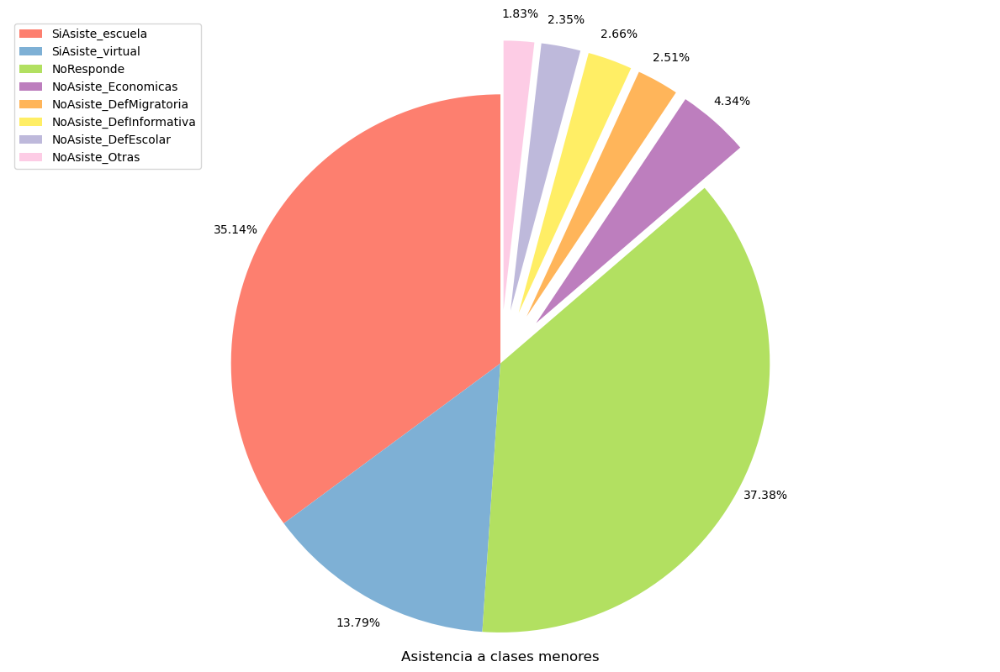

In [38]:
explode_list = [0,0,0,0.2,0.2,0.2,0.2,0.2]
colors = ['#fd7f6f', '#7eb0d5', '#b2e061', '#bd7ebe', '#ffb55a', '#ffee65', '#beb9db', '#fdcce5', '#8bd3c7']
Grafico_grupo.plot(kind='pie',
                            figsize=(12, 8),
                            autopct='%1.2f%%', # add in percentages
                            startangle=90,     # start angle 90° 
                            shadow=False,       # add shadow
                            labels=None,         # turn off labels on pie chart
                            pctdistance=1.10,
                            colors=colors,
                            explode=explode_list 
                            )

plt.title('Asistencia a clases menores', y=-0.02)
plt.axis('equal') # Sets the pie chart to look like a circle.
plt.legend(labels=Grafico_grupo.index, loc='upper left') 

plt.show()

<h4 id="pattern_visualization">IncidentePais</h4>

In [39]:
IncidentePais = data[['homicide_asylum','homicide_othercity','physicalAssault_asylum','physicalAssault_othercity',
                     'sexualAssault_asylum','sexualAssault_othercity','abductionORkidnapping_asylum','abductionORkidnapping_othercity',
                      'exploitationwork_asylum','exploitationwork_othercity','arrestORdetention_asylum','arrestORdetention_othercity',
                      'threat_asylum','threat_othercity','fraud_asylum','fraud_othercity','theft_asylum',
                      'theft_othercity','eviction_asylum','eviction_othercity','evictionthreat_asylum','evictionthreat_othercity',
                      'destructionProperty_asylum','destructionProperty_othercity']].astype(int)

In [40]:
df['IncidentePaisSiNo'] = np.where(IncidentePais['homicide_asylum']          + IncidentePais['homicide_othercity']         + 
                                   IncidentePais['physicalAssault_asylum']   + IncidentePais['physicalAssault_othercity']  +
                                   IncidentePais['sexualAssault_asylum']     + IncidentePais['sexualAssault_othercity']    +
                                   IncidentePais['abductionORkidnapping_asylum'] + IncidentePais['abductionORkidnapping_othercity'] +
                                   IncidentePais['arrestORdetention_asylum'] + IncidentePais['arrestORdetention_othercity']+
                                   IncidentePais['threat_asylum']            + IncidentePais['threat_othercity']           +
                                   IncidentePais['fraud_asylum']             + IncidentePais['fraud_othercity']            +
                                   IncidentePais['theft_asylum']             + IncidentePais['theft_othercity']            +
                                   IncidentePais['eviction_asylum']          + IncidentePais['eviction_othercity']         +
                                   IncidentePais['evictionthreat_asylum']    + IncidentePais['evictionthreat_othercity']   +
                                   IncidentePais['destructionProperty_asylum'] + IncidentePais['destructionProperty_othercity'] >0,1,0)

In [41]:
df['IncidentePaisSiNo'].value_counts().to_frame()

,IncidentePaisSiNo
0,3146
1,680


<h4 id="pattern_visualization">Riesgos</h4>

In [42]:
Riesgos=data[['Riesgo_GrupoArmado','Riesgo_PerseguidosAgresion','Riesgo_Extorsion','Riesgo_Salud',
              'Riesgo_InseguridadPais','Riesgo_FaltaAlimento','Riesgo_NoHayAccesoServMedicos','Riesgo_Otros',
              'Riesgo_ReclutadoGruposCriminales','Riesgo_PrefiereNoDecirlo','Riesgo_NoConseguiriaTrabajo',
              'Riesgo_AmenazaFisica','Riesgo_MiedoInseguridadViolencia']]
df['RiesgosSum'] = Riesgos.sum(axis=1)

In [43]:
df['RiesgosSum'].value_counts().to_frame()

,RiesgosSum
0,1059
3,501
4,496
2,465
1,421
5,228
6,208
7,137
9,101
8,101


<h4 id="pattern_visualization">Documentos</h4>

In [44]:
df['DocsSiNo'] = np.where(data['Docs_DocumentoID'] + data['Docs_PasaporteValido']>0,1,0) 

In [45]:
df['DocsSiNo'].value_counts().to_frame()

,DocsSiNo
1,3597
0,229


<h4 id="pattern_visualization">AplicaRefugioSiNo</h4>

In [46]:
df['AplicaRefugioSiNo'] = np.where(data['IntencionAsilo'] == 'yes',1,0) 

In [47]:
df['AplicaRefugioSiNo'].value_counts().to_frame()

,AplicaRefugioSiNo
1,2705
0,1121


<h4 id="pattern_visualization">Electricidad</h4>

In [48]:
df['Electricidad'] = np.where(data['electricidad'] == 'yes',1,0) 

In [49]:
df['Electricidad'].value_counts().to_frame()

,Electricidad
1,3731
0,95


<h4 id="pattern_visualization">ComidasDiarias</h4>

In [50]:
print(data['comidapordia'])

0         twoORmore
1         twoORmore
2       threeOrmore
3       threeOrmore
4       threeOrmore
           ...     
3945      twoORmore
3946      twoORmore
3947      oneORless
3948      twoORmore
3949      twoORmore
Name: comidapordia, Length: 3826, dtype: object


In [51]:
data['comidapordia'].value_counts().to_frame()

,comidapordia
twoORmore,2186
threeOrmore,1325
oneORless,309
none,6


Text(0.5, 1.0, 'Comidas por día')

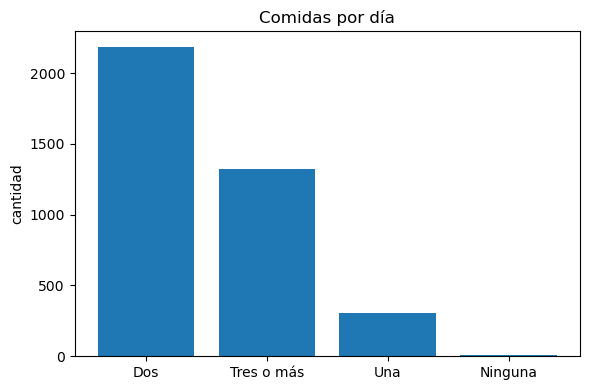

In [52]:
plt.rcParams["figure.figsize"] = [6, 4]
plt.rcParams["figure.autolayout"] = True
etiqueta = ['Dos','Tres o más', 'Una', 'Ninguna']
#pyplot.bar(etiqueta, data['comidapordia'].value_counts())
pyplot.bar(etiqueta, data['comidapordia'].value_counts())

# set x/y labels and plot title
mpl.pyplot.xlabel("")
mpl.pyplot.ylabel("cantidad")
mpl.pyplot.title("Comidas por día")

In [53]:
data['comidapordia'].replace({'none':'0','oneORless':'1','twoORmore':'2','threeOrmore':'3'},inplace=True)
df['ComidasDiarias'] = data['comidapordia'].astype(int)
df['ComidasDiarias'].value_counts().to_frame()

,ComidasDiarias
2,2186
3,1325
1,309
0,6


<h4 id="pattern_visualization">MedidasAfrontar</h4>

In [54]:
Medidas1=data[['CopingMechanism1_aidAgency','CopingMechanism1_aidHost','CopingMechanism1_borrowMoney','CopingMechanism1_changedShelter',
               'CopingMechanism1_familySupport','CopingMechanism1_limitAdultFood','CopingMechanism1_other',
               'CopingMechanism1_reducedFood','CopingMechanism1_reduceExp','CopingMechanism1_sellAssets','CopingMechanism1_skippedRent',
               'CopingMechanism1_useSavings','CopingMechanism1_workFood']].astype(int)
df['MedidasAfrontaSum'] = Medidas1.sum(axis=1)

In [55]:
df['MedidasAfrontaSum'].value_counts().to_frame()

,MedidasAfrontaSum
7,632
6,578
5,465
8,429
4,337
2,323
3,267
9,258
1,243
10,141


<h4 id="pattern_visualization">MedidasExtremas</h4>

In [56]:
Medidas2=data[['CopingMechanism2_beg','CopingMechanism2_childmarriage','CopingMechanism2_foodscrap','CopingMechanism2_notell',
               'CopingMechanism2_other','CopingMechanism2_sendchild','CopingMechanism2_survivalsex',
               'CopingMechanism2_workchild']].astype(int)
df['MedidasExtremasSum'] = Medidas2.sum(axis=1)

In [57]:
df['MedidasExtremasSum'].value_counts().to_frame()

,MedidasExtremasSum
0,2541
1,893
2,302
3,76
4,14


In [58]:
df

,grupotam,TotalMenores,Escuela_NoAsiste,IncidentePaisSiNo,RiesgosSum,DocsSiNo,AplicaRefugioSiNo,Electricidad,ComidasDiarias,MedidasAfrontaSum,MedidasExtremasSum
0,3,1,0,0,0,1,1,1,2,5,0
1,3,2,0,0,5,1,1,1,2,4,1
2,5,2,0,0,0,1,0,1,3,9,0
3,6,2,0,1,0,1,1,1,3,3,2
4,5,3,0,1,2,1,1,1,3,1,1
...,...,...,...,...,...,...,...,...,...,...,...
3945,3,1,0,0,0,1,1,1,2,9,0
3946,6,4,1,0,5,1,1,1,2,7,2
3947,3,1,0,0,9,1,1,1,1,6,3
3948,3,2,2,0,0,1,1,1,2,5,1


<h2 id="pattern_visualization">Normalización</h2>

In [59]:
df.dtypes

grupotam              int32
TotalMenores          int32
Escuela_NoAsiste      int64
IncidentePaisSiNo     int32
RiesgosSum            int64
DocsSiNo              int32
AplicaRefugioSiNo     int32
Electricidad          int32
ComidasDiarias        int32
MedidasAfrontaSum     int64
MedidasExtremasSum    int64
dtype: object

In [60]:
# Calcular la media y la desviación estándar de cada columna
media = np.mean(df, axis=0)
desviacion_estandar = np.std(df, axis=0)

# Normalizar la matriz de datos
matriz_normalizada = (df - media) / desviacion_estandar

In [61]:
matriz_normalizada.head(5)

,grupotam,TotalMenores,Escuela_NoAsiste,IncidentePaisSiNo,RiesgosSum,DocsSiNo,AplicaRefugioSiNo,Electricidad,ComidasDiarias,MedidasAfrontaSum,MedidasExtremasSum
0,-0.401426,-0.426639,-0.344588,-0.464917,-1.044768,0.252318,0.643753,0.159569,-0.434657,-0.192503,-0.616692
1,-0.401426,0.410448,-0.344588,-0.464917,0.767894,0.252318,0.643753,0.159569,-0.434657,-0.573132,0.708106
2,0.725808,0.410448,-0.344588,-0.464917,-1.044768,0.252318,-1.553391,0.159569,1.221715,1.330012,-0.616692
3,1.289425,0.410448,-0.344588,2.150923,-1.044768,0.252318,0.643753,0.159569,1.221715,-0.953761,2.032903
4,0.725808,1.247535,-0.344588,2.150923,-0.319703,0.252318,0.643753,0.159569,1.221715,-1.715018,0.708106


In [62]:
df['ID']=data['ID']
df

,grupotam,TotalMenores,Escuela_NoAsiste,IncidentePaisSiNo,RiesgosSum,DocsSiNo,AplicaRefugioSiNo,Electricidad,ComidasDiarias,MedidasAfrontaSum,MedidasExtremasSum,ID
0,3,1,0,0,0,1,1,1,2,5,0,1
1,3,2,0,0,5,1,1,1,2,4,1,2
2,5,2,0,0,0,1,0,1,3,9,0,3
3,6,2,0,1,0,1,1,1,3,3,2,4
4,5,3,0,1,2,1,1,1,3,1,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...
3945,3,1,0,0,0,1,1,1,2,9,0,3946
3946,6,4,1,0,5,1,1,1,2,7,2,3947
3947,3,1,0,0,9,1,1,1,1,6,3,3948
3948,3,2,2,0,0,1,1,1,2,5,1,3949


<h2 id="pattern_visualization">Variables Likert</h2>

In [63]:
VarLikert = data[['RiesgoSiNo','SentirSeguro','Aislamiento','Discriminacion','Interaccion','Internet']]

In [64]:
data[['Internet']].value_counts().to_frame()

,0
Internet,
EnDesacuerdo,1143
TotalmenteEnDesacuerdo,949
DeAcuerdo,849
Indeciso,769
TotalmenteDeAcuerdo,116


In [65]:
VarLikert

,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet
0,EnDesacuerdo,DeAcuerdo,DeAcuerdo,DeAcuerdo,TotalmenteDeAcuerdo,EnDesacuerdo
1,TotalmenteDeAcuerdo,TotalmenteDeAcuerdo,DeAcuerdo,TotalmenteDeAcuerdo,Indeciso,EnDesacuerdo
2,Indeciso,TotalmenteDeAcuerdo,DeAcuerdo,TotalmenteDeAcuerdo,Indeciso,DeAcuerdo
3,EnDesacuerdo,DeAcuerdo,DeAcuerdo,DeAcuerdo,TotalmenteDeAcuerdo,EnDesacuerdo
4,TotalmenteDeAcuerdo,TotalmenteDeAcuerdo,TotalmenteDeAcuerdo,TotalmenteDeAcuerdo,Indeciso,EnDesacuerdo
...,...,...,...,...,...,...
3945,TotalmenteEnDesacuerdo,TotalmenteDeAcuerdo,TotalmenteEnDesacuerdo,TotalmenteEnDesacuerdo,DeAcuerdo,TotalmenteEnDesacuerdo
3946,TotalmenteDeAcuerdo,TotalmenteDeAcuerdo,EnDesacuerdo,EnDesacuerdo,DeAcuerdo,EnDesacuerdo
3947,DeAcuerdo,DeAcuerdo,DeAcuerdo,TotalmenteDeAcuerdo,Indeciso,EnDesacuerdo
3948,Indeciso,DeAcuerdo,DeAcuerdo,DeAcuerdo,DeAcuerdo,EnDesacuerdo


In [66]:
VarLikert.dtypes

RiesgoSiNo        object
SentirSeguro      object
Aislamiento       object
Discriminacion    object
Interaccion       object
Internet          object
dtype: object

In [67]:
questions_response = {
    1:"TotalmenteEnDesacuerdo",
    2:"EnDesacuerdo",
    3:"Indeciso",
    4:"DeAcuerdo",
    5:"TotalmenteDeAcuerdo"
}

In [68]:
data_cl = VarLikert

data_ss = data_cl.copy()

In [69]:
data_ss

,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet
0,EnDesacuerdo,DeAcuerdo,DeAcuerdo,DeAcuerdo,TotalmenteDeAcuerdo,EnDesacuerdo
1,TotalmenteDeAcuerdo,TotalmenteDeAcuerdo,DeAcuerdo,TotalmenteDeAcuerdo,Indeciso,EnDesacuerdo
2,Indeciso,TotalmenteDeAcuerdo,DeAcuerdo,TotalmenteDeAcuerdo,Indeciso,DeAcuerdo
3,EnDesacuerdo,DeAcuerdo,DeAcuerdo,DeAcuerdo,TotalmenteDeAcuerdo,EnDesacuerdo
4,TotalmenteDeAcuerdo,TotalmenteDeAcuerdo,TotalmenteDeAcuerdo,TotalmenteDeAcuerdo,Indeciso,EnDesacuerdo
...,...,...,...,...,...,...
3945,TotalmenteEnDesacuerdo,TotalmenteDeAcuerdo,TotalmenteEnDesacuerdo,TotalmenteEnDesacuerdo,DeAcuerdo,TotalmenteEnDesacuerdo
3946,TotalmenteDeAcuerdo,TotalmenteDeAcuerdo,EnDesacuerdo,EnDesacuerdo,DeAcuerdo,EnDesacuerdo
3947,DeAcuerdo,DeAcuerdo,DeAcuerdo,TotalmenteDeAcuerdo,Indeciso,EnDesacuerdo
3948,Indeciso,DeAcuerdo,DeAcuerdo,DeAcuerdo,DeAcuerdo,EnDesacuerdo


In [70]:
sns.reset_defaults()
my_color_scheme =[
    plot_likert.colors.TRANSPARENT,
    '#a6611a',
    '#dfc27d',
    '#bababa',
    '#80cdc1',
    '#018571',
]

In [71]:
plot_likert.scales.agree = ['TotalmenteEnDesacuerdo','EnDesacuerdo','Indeciso','DeAcuerdo','TotalmenteDeAcuerdo']

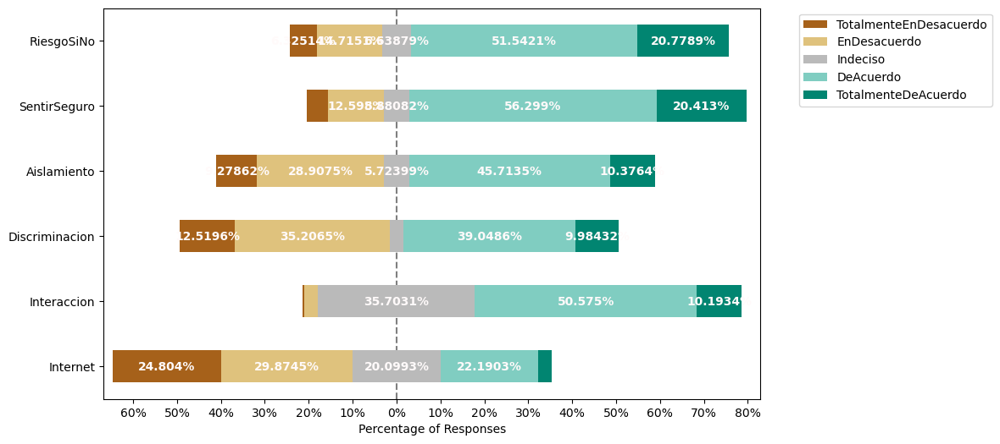

In [72]:
# Colores estándar para la escala Likert
plot_likert.plot_likert(data_ss, plot_likert.scales.agree,
                        plot_percentage=True, figsize=(10,6),
                        colors=my_color_scheme,
                        bar_labels=True, bar_labels_color="snow"
                       )
plt.show()

In [73]:
replacer = {'TotalmenteEnDesacuerdo': 1, 'EnDesacuerdo': 2,
            'Indeciso': 3,
            'DeAcuerdo': 4, 'TotalmenteDeAcuerdo': 5}

# Select String Columns
cols = VarLikert.columns[VarLikert.dtypes == 'object']
# Replace Values in those Columns
VarLikert[cols] = VarLikert[cols].replace(replacer)

In [74]:
VarLikert

,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet
0,2,4,4,4,5,2
1,5,5,4,5,3,2
2,3,5,4,5,3,4
3,2,4,4,4,5,2
4,5,5,5,5,3,2
...,...,...,...,...,...,...
3945,1,5,1,1,4,1
3946,5,5,2,2,4,2
3947,4,4,4,5,3,2
3948,3,4,4,4,4,2


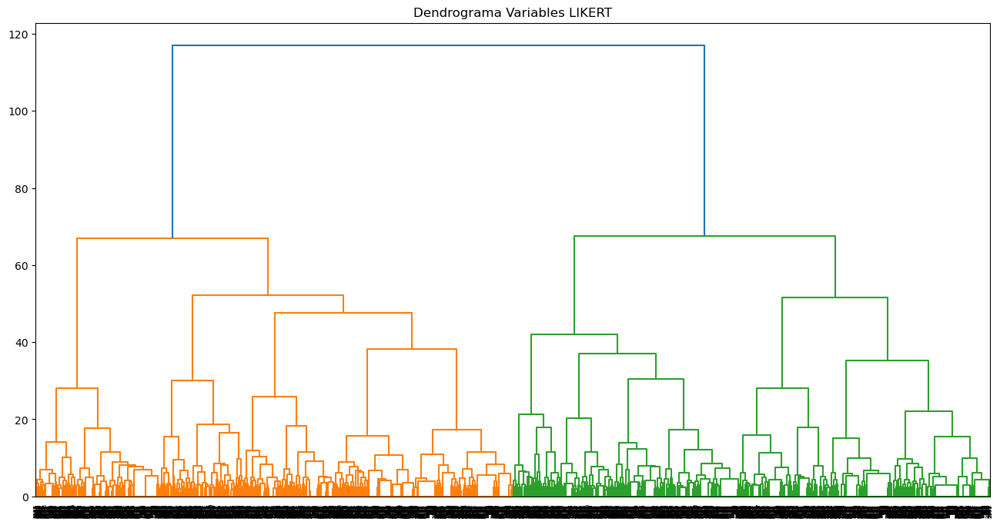

In [75]:
Z=shc.linkage(VarLikert, method='ward')

plt.figure(figsize=(16, 8))
plt.title("Dendrograma Variables LIKERT")
dend = shc.dendrogram(shc.linkage(VarLikert, method='ward'))
plt.show()

In [76]:
VarLikert['ID'] = data['ID']
VarLikert

,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet,ID
0,2,4,4,4,5,2,1
1,5,5,4,5,3,2,2
2,3,5,4,5,3,4,3
3,2,4,4,4,5,2,4
4,5,5,5,5,3,2,5
...,...,...,...,...,...,...,...
3945,1,5,1,1,4,1,3946
3946,5,5,2,2,4,2,3947
3947,4,4,4,5,3,2,3948
3948,3,4,4,4,4,2,3949


<h2 id="pattern_visualization">Matriz de análisis</h2>

In [77]:
df1 = df.merge(VarLikert, on='ID', how='left')
df1

,grupotam,TotalMenores,Escuela_NoAsiste,IncidentePaisSiNo,RiesgosSum,DocsSiNo,AplicaRefugioSiNo,Electricidad,ComidasDiarias,MedidasAfrontaSum,MedidasExtremasSum,ID,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet
0,3,1,0,0,0,1,1,1,2,5,0,1,2,4,4,4,5,2
1,3,2,0,0,5,1,1,1,2,4,1,2,5,5,4,5,3,2
2,5,2,0,0,0,1,0,1,3,9,0,3,3,5,4,5,3,4
3,6,2,0,1,0,1,1,1,3,3,2,4,2,4,4,4,5,2
4,5,3,0,1,2,1,1,1,3,1,1,5,5,5,5,5,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,3,1,0,0,0,1,1,1,2,9,0,3946,1,5,1,1,4,1
3822,6,4,1,0,5,1,1,1,2,7,2,3947,5,5,2,2,4,2
3823,3,1,0,0,9,1,1,1,1,6,3,3948,4,4,4,5,3,2
3824,3,2,2,0,0,1,1,1,2,5,1,3949,3,4,4,4,4,2


In [78]:
df1 = df.merge(VarLikert)
first_column = df1.pop('ID')
df1.insert(0, 'ID', first_column)
tabla = df1
df1

,ID,grupotam,TotalMenores,Escuela_NoAsiste,IncidentePaisSiNo,RiesgosSum,DocsSiNo,AplicaRefugioSiNo,Electricidad,ComidasDiarias,MedidasAfrontaSum,MedidasExtremasSum,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet
0,1,3,1,0,0,0,1,1,1,2,5,0,2,4,4,4,5,2
1,2,3,2,0,0,5,1,1,1,2,4,1,5,5,4,5,3,2
2,3,5,2,0,0,0,1,0,1,3,9,0,3,5,4,5,3,4
3,4,6,2,0,1,0,1,1,1,3,3,2,2,4,4,4,5,2
4,5,5,3,0,1,2,1,1,1,3,1,1,5,5,5,5,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,3946,3,1,0,0,0,1,1,1,2,9,0,1,5,1,1,4,1
3822,3947,6,4,1,0,5,1,1,1,2,7,2,5,5,2,2,4,2
3823,3948,3,1,0,0,9,1,1,1,1,6,3,4,4,4,5,3,2
3824,3949,3,2,2,0,0,1,1,1,2,5,1,3,4,4,4,4,2


## ESCALADO DE VARIABLES MATRIZ UNIFICADA

In [79]:
# Calcular la media y la desviación estándar de cada columna para escalar
df2 = df1.iloc[:, 1:18]
media = np.mean(df2, axis=0)
desviacion_estandar = np.std(df2, axis=0)

# Normalizar la matriz de datos
matriz_normalizada1 = (df2 - media) / desviacion_estandar
matriz_normalizada1.head(5)

,grupotam,TotalMenores,Escuela_NoAsiste,IncidentePaisSiNo,RiesgosSum,DocsSiNo,AplicaRefugioSiNo,Electricidad,ComidasDiarias,MedidasAfrontaSum,MedidasExtremasSum,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet
0,-0.401426,-0.426639,-0.344588,-0.464917,-1.044768,0.252318,0.643753,0.159569,-0.434657,-0.192503,-0.616692,-1.445476,0.235341,0.662166,0.789846,1.861529,-0.416433
1,-0.401426,0.410448,-0.344588,-0.464917,0.767894,0.252318,0.643753,0.159569,-0.434657,-0.573132,0.708106,1.171016,1.173274,0.662166,1.570107,-0.939183,-0.416433
2,0.725808,0.410448,-0.344588,-0.464917,-1.044768,0.252318,-1.553391,0.159569,1.221715,1.330012,-0.616692,-0.573312,1.173274,0.662166,1.570107,-0.939183,1.291256
3,1.289425,0.410448,-0.344588,2.150923,-1.044768,0.252318,0.643753,0.159569,1.221715,-0.953761,2.032903,-1.445476,0.235341,0.662166,0.789846,1.861529,-0.416433
4,0.725808,1.247535,-0.344588,2.150923,-0.319703,0.252318,0.643753,0.159569,1.221715,-1.715018,0.708106,1.171016,1.173274,1.479670,1.570107,-0.939183,-0.416433


visualizacion escalado de variables

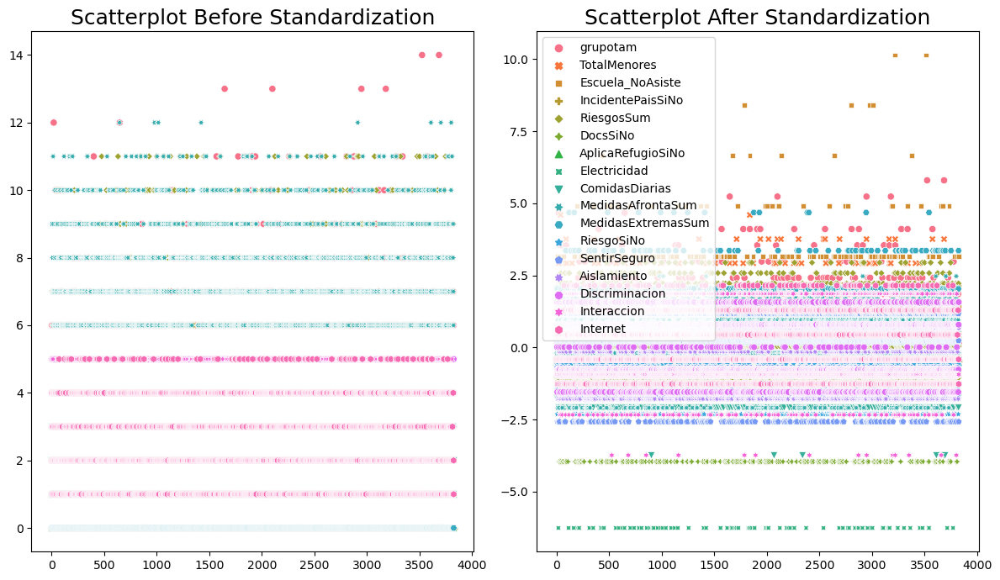

In [80]:
plt.figure(figsize=(12,7))
plt.subplot(1,2,1)
plt.title("Scatterplot Before Standardization", fontsize=18)
sns.scatterplot(data = df1, color="blue", legend=False)
plt.subplot(1,2,2)
plt.title("Scatterplot After Standardization", fontsize=18)
sns.scatterplot(data = matriz_normalizada1, color="red")
plt.tight_layout()
plt.show()

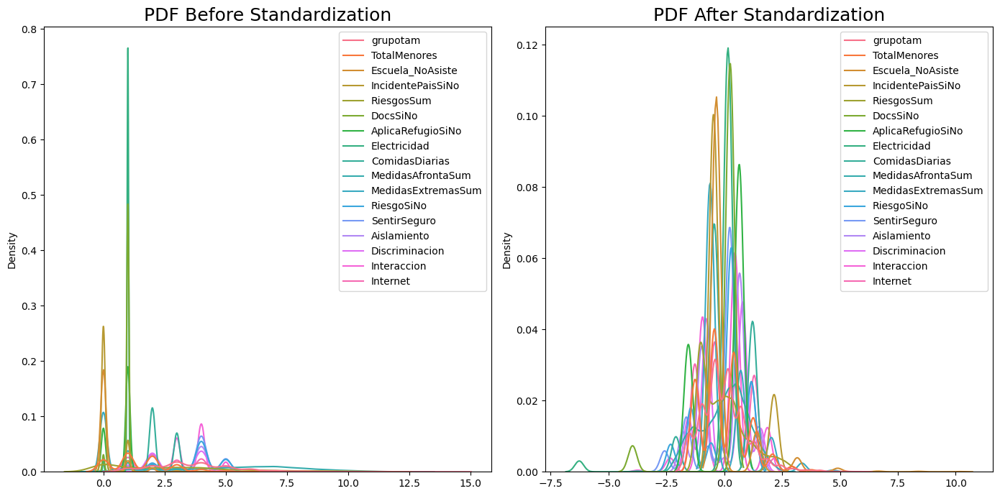

In [81]:
# plotting the scatterplot of before and after Standardization
plt.figure(figsize=(14,7))
plt.subplot(1,2,1)
plt.title("PDF Before Standardization", fontsize=18)
sns.kdeplot(data = df1, color="blue")
plt.subplot(1,2,2)
plt.title("PDF After Standardization", fontsize=18)
sns.kdeplot(data = matriz_normalizada1, color="red")
plt.tight_layout()
plt.show()

<h2 id="pattern_visualization">Valor óptimo K</h2>

<h4 id="pattern_visualization">1. Matriz de análisis</h4>

In [82]:
matriz_normalizada1.head(5)

,grupotam,TotalMenores,Escuela_NoAsiste,IncidentePaisSiNo,RiesgosSum,DocsSiNo,AplicaRefugioSiNo,Electricidad,ComidasDiarias,MedidasAfrontaSum,MedidasExtremasSum,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet
0,-0.401426,-0.426639,-0.344588,-0.464917,-1.044768,0.252318,0.643753,0.159569,-0.434657,-0.192503,-0.616692,-1.445476,0.235341,0.662166,0.789846,1.861529,-0.416433
1,-0.401426,0.410448,-0.344588,-0.464917,0.767894,0.252318,0.643753,0.159569,-0.434657,-0.573132,0.708106,1.171016,1.173274,0.662166,1.570107,-0.939183,-0.416433
2,0.725808,0.410448,-0.344588,-0.464917,-1.044768,0.252318,-1.553391,0.159569,1.221715,1.330012,-0.616692,-0.573312,1.173274,0.662166,1.570107,-0.939183,1.291256
3,1.289425,0.410448,-0.344588,2.150923,-1.044768,0.252318,0.643753,0.159569,1.221715,-0.953761,2.032903,-1.445476,0.235341,0.662166,0.789846,1.861529,-0.416433
4,0.725808,1.247535,-0.344588,2.150923,-0.319703,0.252318,0.643753,0.159569,1.221715,-1.715018,0.708106,1.171016,1.173274,1.479670,1.570107,-0.939183,-0.416433


<h4 id="pattern_visualization">2. Método Elbow para encontrar valor óptimo de K</h4>

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 29468.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 29468.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 29468.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 29468.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 29468.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 723, cost: 27802.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 541, cost: 28013.0
Run 2, iteration: 2/100, moves: 395, cost: 27714.0
Run 2, iteration: 3/

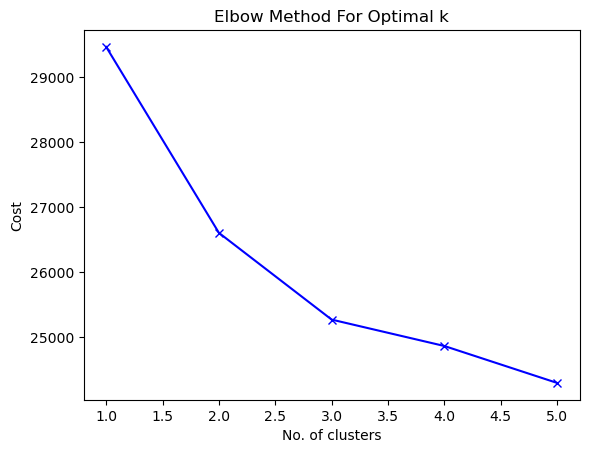

In [83]:
# Elbow curve to find optimal K
cost = []
K = range(1,6)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(matriz_normalizada1)
    cost.append(kmode.cost_)
    
plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

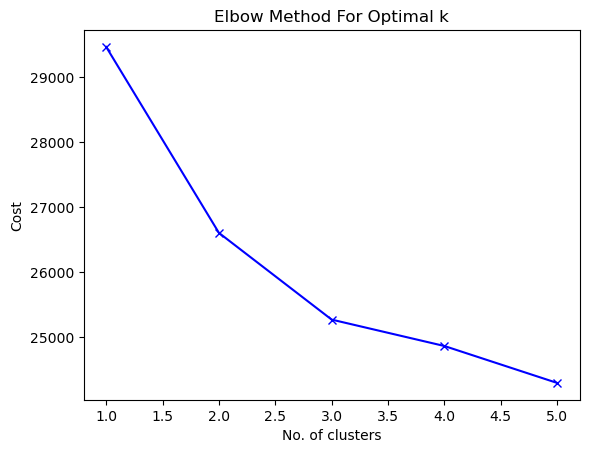

In [84]:
plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

Hierarchical clustering

Hierarchical clustering es una alternativa a los métodos de partitioning clustering que no requiere que se pre-especifique el número de clusters. Los métodos que engloba el hierarchical clustering son dos, pero aplicaremos el aglomerativo. 

El tipo de medida para cuantificar la similitud entre observaciones o grupos (linkage) es WARD

DENDOGRAMA

In [85]:
import scipy.cluster.hierarchy as shc

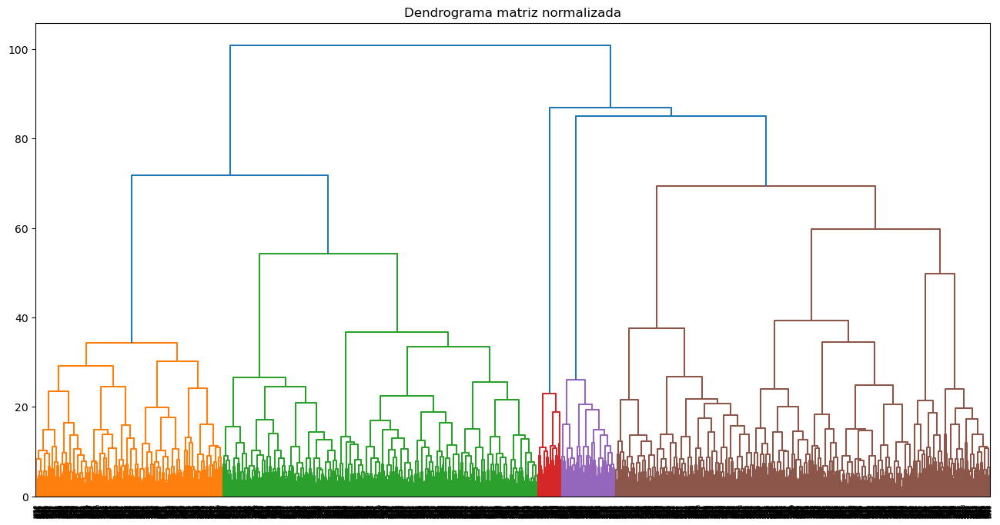

In [86]:
Z=shc.linkage(matriz_normalizada1, method='ward')

plt.figure(figsize=(16, 8))
plt.title("Dendrograma matriz normalizada")
dend = shc.dendrogram(shc.linkage(matriz_normalizada1, method='ward'))
plt.show()

In [87]:
Z

array([[1.58800000e+03, 2.99400000e+03, 0.00000000e+00, 2.00000000e+00],
       [4.80000000e+01, 1.97000000e+02, 0.00000000e+00, 2.00000000e+00],
       [7.80000000e+02, 2.60900000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [7.63200000e+03, 7.64600000e+03, 8.50577485e+01, 1.71800000e+03],
       [7.62300000e+03, 7.64800000e+03, 8.69839029e+01, 1.81300000e+03],
       [7.64700000e+03, 7.64900000e+03, 1.00834147e+02, 3.82600000e+03]])

<h2 id="pattern_visualization">Dendograma truncado</h2>

In [88]:
def fancy_dendrogram(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Dendrograma de agrupamiento jerárquio (truncado)')
        plt.xlabel('Tamaño de muestras')
        plt.ylabel('distancia')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')

    return ddata

d = [100, 85, 70, 60]

@ipywidgets.interact
def plot(Clusters=[2, 3, 4, 5]):
    cluster = AgglomerativeClustering(n_clusters=Clusters, affinity='euclidean', linkage='ward')
    labels = cluster.fit_predict(data_cl)
    df['cluster'] = labels.astype('str')
    df['cluster'] = df['cluster'].astype("category")
    print(np.unique(labels, return_counts=True))

    plt.figure(figsize=(12, 8))
    fancy_dendrogram(
        Z,
        truncate_mode='lastp',
        p=12,
        leaf_rotation=90.,
        leaf_font_size=12.,
        show_contracted=True,
        annotate_above=10,
        max_d=d[Clusters-2],
    );
    plt.show()

interactive(children=(Dropdown(description='Clusters', options=(2, 3, 4, 5), value=2), Output()), _dom_classes…

<h2 id="pattern_visualization">Variables descriptivas</h2>

<h4 id="pattern_visualization">A) Fecha llegada</h4>

In [89]:
VarDescriptivo = data[['FechaLlegaEC']]
VarDescriptivo.value_counts().to_frame()

,0
FechaLlegaEC,
2019,959
2017 or earlier,784
2021,759
2020,674
2018,643


<h4 id="pattern_visualization">B) Transporte</h4>

In [90]:
data[['TransBote','TransBus','TransAuto','TransSendero','TransOtro','TransAvion','TransTaxi']]=data[['TransBote','TransBus','TransAuto','TransSendero','TransOtro','TransAvion','TransTaxi']].fillna(0).astype(int) 
transporte=data[['TransBote','TransBus','TransAuto','TransSendero','TransOtro','TransAvion','TransTaxi']].astype(int)
transporte

,TransBote,TransBus,TransAuto,TransSendero,TransOtro,TransAvion,TransTaxi
0,0,1,0,0,0,0,0
1,0,1,0,0,0,1,0
2,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0
4,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...
3945,0,0,0,0,0,0,0
3946,0,0,0,0,0,0,0
3947,0,1,0,0,0,0,0
3948,0,1,0,1,0,0,0


In [91]:
transporte['TransOtro'] = np.where(transporte.sum(axis=1) == 0, 1 , transporte['TransOtro'])
transporte['TransAuto'] = np.where(transporte['TransTaxi']>0, 1,transporte['TransAuto'])
transporte.drop(['TransTaxi'],axis=1, inplace=True)

In [92]:
transporte['TransMixto'] = 0
transporte['TransMixto'] = np.where(transporte.sum(axis=1) > 1, transporte.sum(axis=1) , 0)
transporte

,TransBote,TransBus,TransAuto,TransSendero,TransOtro,TransAvion,TransMixto
0,0,1,0,0,0,0,0
1,0,1,0,0,0,1,2
2,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0
4,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...
3945,0,0,0,0,1,0,0
3946,0,0,0,0,1,0,0
3947,0,1,0,0,0,0,0
3948,0,1,0,1,0,0,2


In [93]:
transporte['TransBote'] = np.where(transporte['TransMixto']>0, 0,transporte['TransBote'])
transporte['TransBus'] = np.where(transporte['TransMixto']>0, 0,transporte['TransBus'])
transporte['TransAuto'] = np.where(transporte['TransMixto']>0, 0,transporte['TransAuto'])
transporte['TransSendero'] = np.where(transporte['TransMixto']>0, 0,transporte['TransSendero'])
transporte['TransOtro'] = np.where(transporte['TransMixto']>0, 0,transporte['TransOtro'])
transporte['TransAvion'] = np.where(transporte['TransMixto']>0, 0,transporte['TransAvion'])
transporte['TransMixto'] = np.where(transporte['TransMixto']>0, 1,0)
transporte

,TransBote,TransBus,TransAuto,TransSendero,TransOtro,TransAvion,TransMixto
0,0,1,0,0,0,0,0
1,0,0,0,0,0,0,1
2,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0
4,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...
3945,0,0,0,0,1,0,0
3946,0,0,0,0,1,0,0
3947,0,1,0,0,0,0,0
3948,0,0,0,0,0,0,1


In [94]:
transporte.value_counts().to_frame()

0
TransBote TransBus TransAuto TransSendero TransOtro TransAvion TransMixto      
0         1        0         0            0         0          0           2679
          0        0         0            0         0          1            527
                             1            0         0          0            277
                             0            1         0          0            125
1         0        0         0            0         0          0             97
0         0        1         0            0         0          0             82
                   0         0            0         1          0             39

In [95]:
transporte['Tipo'] = np.where(transporte['TransBus']     == 1,'Bus',0)
transporte['Tipo'] = np.where(transporte['TransMixto']   == 1,'Mixto',transporte['Tipo'])
transporte['Tipo'] = np.where(transporte['TransSendero'] == 1,'Sendero',transporte['Tipo'])
transporte['Tipo'] = np.where(transporte['TransOtro']    == 1,'Otro',transporte['Tipo'])
transporte['Tipo'] = np.where(transporte['TransBote']    == 1,'Bote',transporte['Tipo'])
transporte['Tipo'] = np.where(transporte['TransAuto']    == 1,'Auto',transporte['Tipo'])
transporte['Tipo'] = np.where(transporte['TransAvion']   == 1,'Avion',transporte['Tipo'])
transporte.head(5)

,TransBote,TransBus,TransAuto,TransSendero,TransOtro,TransAvion,TransMixto,Tipo
0,0,1,0,0,0,0,0,Bus
1,0,0,0,0,0,0,1,Mixto
2,0,1,0,0,0,0,0,Bus
3,0,1,0,0,0,0,0,Bus
4,0,1,0,0,0,0,0,Bus


In [96]:
VarDescriptivo['Transporte'] = transporte[['Tipo']]
VarDescriptivo

,FechaLlegaEC,Transporte
0,2018,Bus
1,2017 or earlier,Mixto
2,2018,Bus
3,2018,Bus
4,2017 or earlier,Bus
...,...,...
3945,2018,Otro
3946,2021,Otro
3947,2021,Bus
3948,2020,Mixto


<h4 id="pattern_visualization">C) Etnia</h4>

In [97]:
VarDescriptivo['etnia'] = data[['ethnicity']]
VarDescriptivo['etnia'] = VarDescriptivo['etnia'].fillna('')
VarDescriptivo['etnia'].replace({'':'mixta'},inplace=True)

In [98]:
VarDescriptivo['etnia'].value_counts().to_frame()

,etnia
mixta,2816
negro,462
blanco,412
otro,107
indigena,29


In [99]:
VarDescriptivo

,FechaLlegaEC,Transporte,etnia
0,2018,Bus,mixta
1,2017 or earlier,Mixto,mixta
2,2018,Bus,mixta
3,2018,Bus,otro
4,2017 or earlier,Bus,negro
...,...,...,...
3945,2018,Otro,mixta
3946,2021,Otro,blanco
3947,2021,Bus,negro
3948,2020,Mixto,mixta


<h4 id="pattern_visualization">D) DejarFamiliares</h4>

In [100]:
VarDescriptivo['DejarFamiliares'] = data[["FamiliyLeft"]]
VarDescriptivo['DejarFamiliares'].replace({'nosabe':'no','nodice':'no'},inplace=True)
VarDescriptivo['DejarFamiliares'].value_counts().to_frame()

,DejarFamiliares
si,2347
no,1479


<h4 id="pattern_visualization">E) EntraRegular</h4>

In [101]:
VarDescriptivo['EntradaRegular'] = data[["EntradaRegular"]]
VarDescriptivo['EntradaRegular'].replace({'nolodice':'no','permanecepais':'no'},inplace=True)
VarDescriptivo['EntradaRegular'].value_counts().to_frame()

,EntradaRegular
si,2210
no,1616


<h4 id="pattern_visualization">F) DocumentosResidencia</h4>

In [102]:
VarDescriptivo['DocsResidencia'] = data[["DocsResidencia"]]
VarDescriptivo['DocsResidencia'].replace({'nolodice':'irregular'},inplace=True)
VarDescriptivo['DocsResidencia'].value_counts().to_frame()

,DocsResidencia
irregular,2341
visahumanitaria,694
visaresidenciatemp,332
permiso,286
visaresidenciaperm,101
visapendiente,65
visaturista,7


<h4 id="pattern_visualization">G) AccesoASalud</h4>

In [103]:
VarDescriptivo['AccesoASalud'] = data[["medicalAttention"]]
data[['medicalType_center', 'medicalType_hospital', 'medicalType_other', 'medicalType_clinic']] = data[['medicalType_center',
      'medicalType_hospital', 'medicalType_other', 'medicalType_clinic']].astype('int')
VarDescriptivo['AccesoASalud'] = data[["medicalAttention"]]
VarDescriptivo['AccesoASalud'].replace({'selfmedicated':'Automedicado','shaman':'Automedicado','NoAnswer':'NoFacilidad','couldnot':'NoFacilidad',
                                        'couldnotgo':'NoFacilidad','no':'NoNecesita'},inplace=True)

In [104]:
alfa = data['medicalType_center'] + data['medicalType_hospital'] + data['medicalType_other']
VarDescriptivo['AccesoASalud'] = np.where((alfa > 0) & (data['medicalType_clinic'] > 0), 'Publico-Privado',VarDescriptivo['AccesoASalud'])
VarDescriptivo['AccesoASalud'] = np.where((alfa > 0) & (data['medicalType_clinic'] < 1), 'Publico',VarDescriptivo['AccesoASalud'])
VarDescriptivo['AccesoASalud'] = np.where((alfa < 1) & (data['medicalType_clinic'] > 0), 'Privado',VarDescriptivo['AccesoASalud'])
VarDescriptivo['AccesoASalud'].value_counts().to_frame()

,AccesoASalud
Publico,2942
NoNecesita,611
NoFacilidad,121
Privado,61
Publico-Privado,58
Automedicado,33


<h4 id="pattern_visualization">H) Vivienda</h4>

In [105]:
VarDescriptivo['ViviendaTipo'] = data[["tipovivienda"]]
VarDescriptivo['ViviendaTipo'].replace({'Owned':'Propios','Rental':'Rentadas','Hosted':'Auspiciadas','RoomRent':'Compartidas',
                                        'sharedRental':'Compartidas','Collective':'Compartidas','Spontaneous':'Temporales',
                                        'Squatting':'Temporales','other':'Temporales','Hotel':'Temporales'},inplace=True)
VarDescriptivo['ViviendaTipo'].value_counts().to_frame()

,ViviendaTipo
Rentadas,1930
Compartidas,1507
Auspiciadas,169
Temporales,148
Propios,72


<h4 id="pattern_visualization">I) Agua</h4>

In [106]:
VarDescriptivo['agua'] = data[["agua"]]
VarDescriptivo['agua'].replace({'PipedPlot':'Potable','ProtectBoreh':'Potable','BottMinWat':'Botellones','TapNetMore2':'Filtrada',
                                'TapNetLess2':'Filtrada','TankTruckNgoUN':'AbasteceORG','PublicShareTaps':'AbasteceORG',
                                'Rainwater':'FuentesAgua','BodyofWater':'FuentesAgua','UnprotectBore':'FuentesAgua',
                                'other':'FuentesAgua','NoAnswer':'FuentesAgua'},inplace=True)
VarDescriptivo['agua'].value_counts().to_frame()

,agua
Filtrada,3101
Botellones,343
AbasteceORG,202
FuentesAgua,106
Potable,74


<h4 id="pattern_visualization">J) Sanitario</h4>

In [107]:
VarDescriptivo['sanitario'] = data[["sanitario"]]
VarDescriptivo['sanitario'].replace({'Private_toilet':'BanoPrivado','Shared_toilet':'Compartido','Collective_toilet':'Externo',
                                     'Outhouse':'Externo','No_toilet':'NoTiene','dontknow':'NoTiene','notell':'NoTiene'},inplace=True)
VarDescriptivo['sanitario'].value_counts().to_frame()

,sanitario
BanoPrivado,2356
Compartido,1186
Externo,218
NoTiene,66


<h4 id="pattern_visualization">K) Nacionalidad</h4>

In [108]:
VarDescriptivo['nacionalidad'] = data[["nacionalidad"]]
VarDescriptivo['nacionalidad'].value_counts().to_frame()

,nacionalidad
venezuela,2115
colombia,1554


In [109]:
VarDescriptivo

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,nacionalidad
0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,venezuela
1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,venezuela
2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,venezuela
3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,venezuela
4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,colombia
...,...,...,...,...,...,...,...,...,...,...,...
3945,2018,Otro,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,venezuela
3946,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,venezuela
3947,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,colombia
3948,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,venezuela


In [110]:
VarDescriptivo_reset = VarDescriptivo.reset_index()
VarDescriptivo_reset

,index,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,nacionalidad
0,0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,venezuela
1,1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,venezuela
2,2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,venezuela
3,3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,venezuela
4,4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,colombia
...,...,...,...,...,...,...,...,...,...,...,...,...
3821,3945,2018,Otro,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,venezuela
3822,3946,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,venezuela
3823,3947,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,colombia
3824,3948,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,venezuela


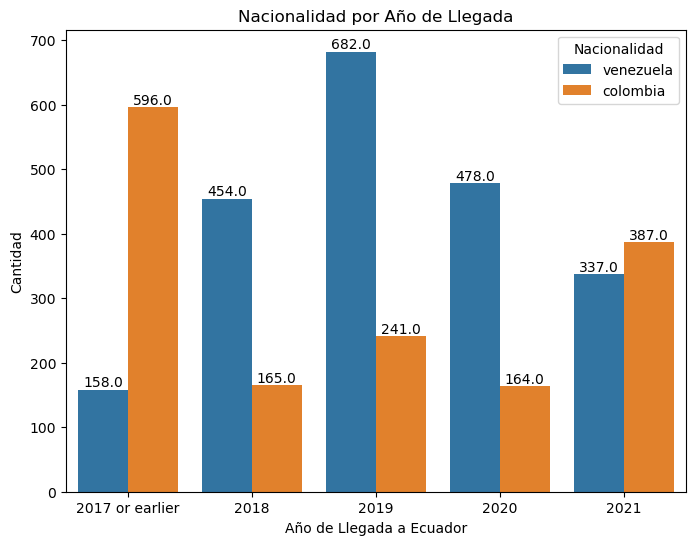

In [111]:
# Crear un gráfico de barras ordenado por año
plt.figure(figsize=(8, 6))
ax=sns.countplot(x='FechaLlegaEC', hue='nacionalidad', data=VarDescriptivo_reset, order=VarDescriptivo_reset['FechaLlegaEC'].value_counts().index.sort_values())

plt.xlabel('Año de Llegada a Ecuador')
plt.ylabel('Cantidad')
plt.title('Nacionalidad por Año de Llegada')
plt.legend(title='Nacionalidad')

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=10, color='black', xytext=(0, 5), textcoords='offset points')
plt.show()

<h2 id="pattern_visualization">Integración de matrices</h2>

In [112]:
tabla = tabla.rename(columns={'grupotam':'Q1:grupotam','TotalMenores':'Q2:Menores','Escuela_NoAsiste':'Q3:Escuela','IncidentePaisSiNo':'Q4:IncidentePais','RiesgosSum':'Q5:RiesgosSum',
                              'DocsSiNo':'Q6:DocsSiNo','AplicaRefugioSiNo':'Q7:AplicaRefugio','Electricidad':'Q8:Electricidad','ComidasDiarias':'Q9:Alimentacion',
                              'MedidasAfrontaSum':'Q10:MedidasAfronta','MedidasExtremasSum':'Q11:MedidasExtremas','RiesgoSiNo':'Q12:Riesgos','SentirSeguro':'Q13:SentirSeguro',
                              'Aislamiento':'Q14:Aislamiento','Discriminacion':'Q15:Discriminacion','Interaccion':'Q16:Interaccion','Internet':'Q17:Internet'})

In [113]:
matriz  = pd.concat([VarDescriptivo_reset, tabla], axis=1).reindex(tabla.index)
matriz = matriz.drop('index',axis=1)
matriz = matriz.drop('ID',axis=1)
matriz[['Q1:grupotam','Q2:Menores','Q4:IncidentePais','Q6:DocsSiNo','Q7:AplicaRefugio','Q8:Electricidad','Q9:Alimentacion']] = matriz[['Q1:grupotam','Q2:Menores','Q4:IncidentePais','Q6:DocsSiNo','Q7:AplicaRefugio','Q8:Electricidad','Q9:Alimentacion']].astype("int64")
matriz

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q8:Electricidad,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet
0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,1,2,5,0,2,4,4,4,5,2
1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,...,1,2,4,1,5,5,4,5,3,2
2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,1,3,9,0,3,5,4,5,3,4
3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,...,1,3,3,2,2,4,4,4,5,2
4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,1,3,1,1,5,5,5,5,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,2018,Otro,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,1,2,9,0,1,5,1,1,4,1
3822,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,1,2,7,2,5,5,2,2,4,2
3823,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,1,1,6,3,4,4,4,5,3,2
3824,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,...,1,2,5,1,3,4,4,4,4,2


In [114]:
hue=matriz.select_dtypes(include = 'object').columns
hue

Index(['FechaLlegaEC', 'Transporte', 'etnia', 'DejarFamiliares',
       'EntradaRegular', 'DocsResidencia', 'AccesoASalud', 'ViviendaTipo',
       'agua', 'sanitario', 'nacionalidad'],
      dtype='object')

In [115]:
df = matriz_normalizada1
df

,grupotam,TotalMenores,Escuela_NoAsiste,IncidentePaisSiNo,RiesgosSum,DocsSiNo,AplicaRefugioSiNo,Electricidad,ComidasDiarias,MedidasAfrontaSum,MedidasExtremasSum,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet
0,-0.401426,-0.426639,-0.344588,-0.464917,-1.044768,0.252318,0.643753,0.159569,-0.434657,-0.192503,-0.616692,-1.445476,0.235341,0.662166,0.789846,1.861529,-0.416433
1,-0.401426,0.410448,-0.344588,-0.464917,0.767894,0.252318,0.643753,0.159569,-0.434657,-0.573132,0.708106,1.171016,1.173274,0.662166,1.570107,-0.939183,-0.416433
2,0.725808,0.410448,-0.344588,-0.464917,-1.044768,0.252318,-1.553391,0.159569,1.221715,1.330012,-0.616692,-0.573312,1.173274,0.662166,1.570107,-0.939183,1.291256
3,1.289425,0.410448,-0.344588,2.150923,-1.044768,0.252318,0.643753,0.159569,1.221715,-0.953761,2.032903,-1.445476,0.235341,0.662166,0.789846,1.861529,-0.416433
4,0.725808,1.247535,-0.344588,2.150923,-0.319703,0.252318,0.643753,0.159569,1.221715,-1.715018,0.708106,1.171016,1.173274,1.479670,1.570107,-0.939183,-0.416433
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,-0.401426,-0.426639,-0.344588,-0.464917,-1.044768,0.252318,0.643753,0.159569,-0.434657,1.330012,-0.616692,-2.317640,1.173274,-1.790347,-1.550937,0.461173,-1.270278
3822,1.289425,2.084622,1.403943,-0.464917,0.767894,0.252318,0.643753,0.159569,-0.434657,0.568755,2.032903,1.171016,1.173274,-0.972843,-0.770676,0.461173,-0.416433
3823,-0.401426,-0.426639,-0.344588,-0.464917,2.218024,0.252318,0.643753,0.159569,-2.091028,0.188126,3.357701,0.298852,0.235341,0.662166,1.570107,-0.939183,-0.416433
3824,-0.401426,0.410448,3.152473,-0.464917,-1.044768,0.252318,0.643753,0.159569,-0.434657,-0.192503,0.708106,-0.573312,0.235341,0.662166,0.789846,0.461173,-0.416433


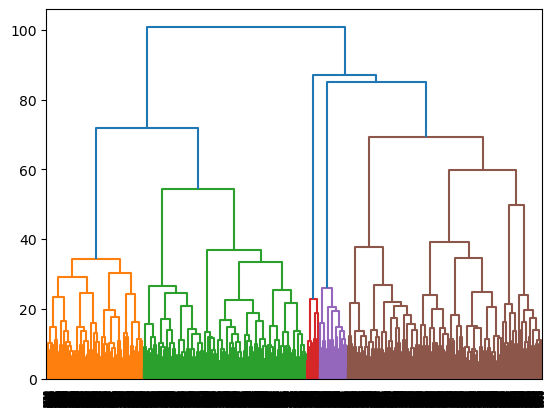

In [116]:
linkage_data = linkage(df, method='ward', metric='euclidean')
dendrogram(linkage_data)
plt.show()

In [117]:
#***CLUSTER JERARQUICO (K=2)****
hierarchical_cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
labels = hierarchical_cluster.fit_predict(df)
labels

array([1, 0, 1, ..., 0, 0, 1], dtype=int64)

  File "C:\Users\Usuario\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 217, in _count_physical_cores
    raise ValueError(


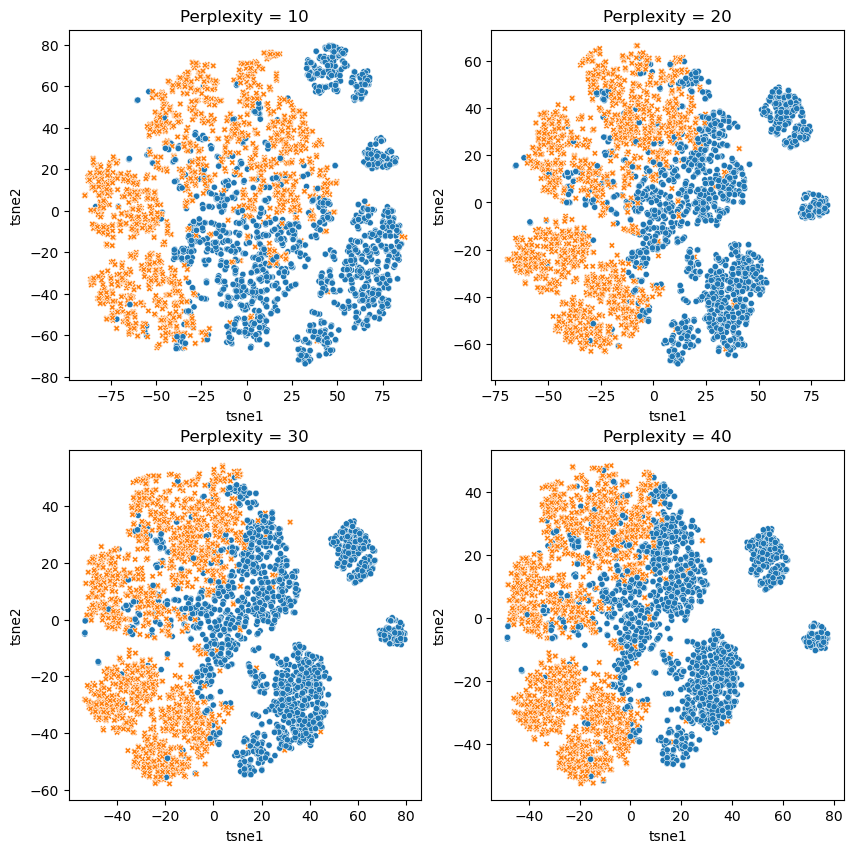

In [118]:
plt.figure(figsize=(10,10))
for index, p in enumerate([10, 20, 30, 40]):

    tsne = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results = tsne.fit_transform(df)
    
    tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2'])
    
    tsne_results['cluster'] = pd.Categorical(labels)
    
    plt.subplot(2,2,index+1)
    sns.scatterplot(data=tsne_results, x='tsne1', y='tsne2', 
                    hue="cluster", style="cluster", s=20)
    plt.title('Perplexity = '+ str(p))
    plt.legend([],[], frameon=False)
plt.show()

In [119]:
#***CLUSTER JERARQUICO (K=4)****
hierarchical_cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
labels1 = hierarchical_cluster.fit_predict(df)
labels1

array([0, 1, 0, ..., 1, 1, 0], dtype=int64)

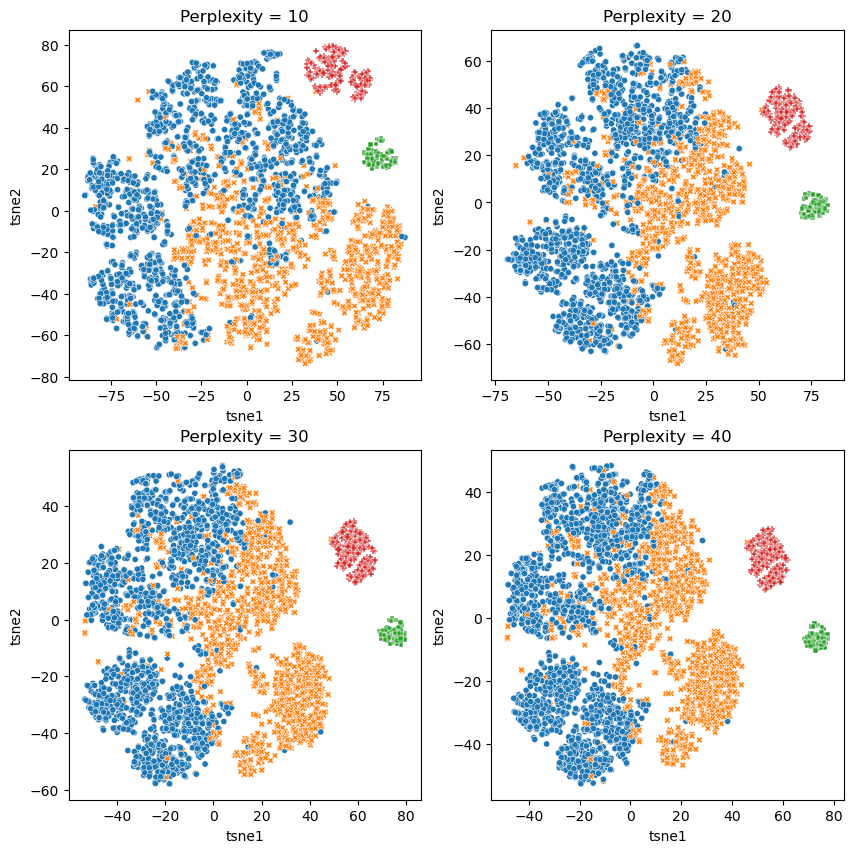

In [120]:
plt.figure(figsize=(10,10))
for index, p in enumerate([10, 20, 30, 40]):

    tsne1 = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results1 = tsne1.fit_transform(df)
    
    tsne_results1=pd.DataFrame(tsne_results1, columns=['tsne1', 'tsne2'])
    
    tsne_results1['cluster1'] = pd.Categorical(labels1)
    
    plt.subplot(2,2,index+1)
    sns.scatterplot(data=tsne_results1, x='tsne1', y='tsne2', 
                    hue="cluster1", style="cluster1", s=20)
    plt.title('Perplexity = '+ str(p))
    plt.legend([],[], frameon=False)
plt.show()

In [121]:
#***CLUSTER JERARQUICO (K=5)****
hierarchical_cluster = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
labels2 = hierarchical_cluster.fit_predict(df)
labels2

array([4, 0, 1, ..., 0, 0, 1], dtype=int64)

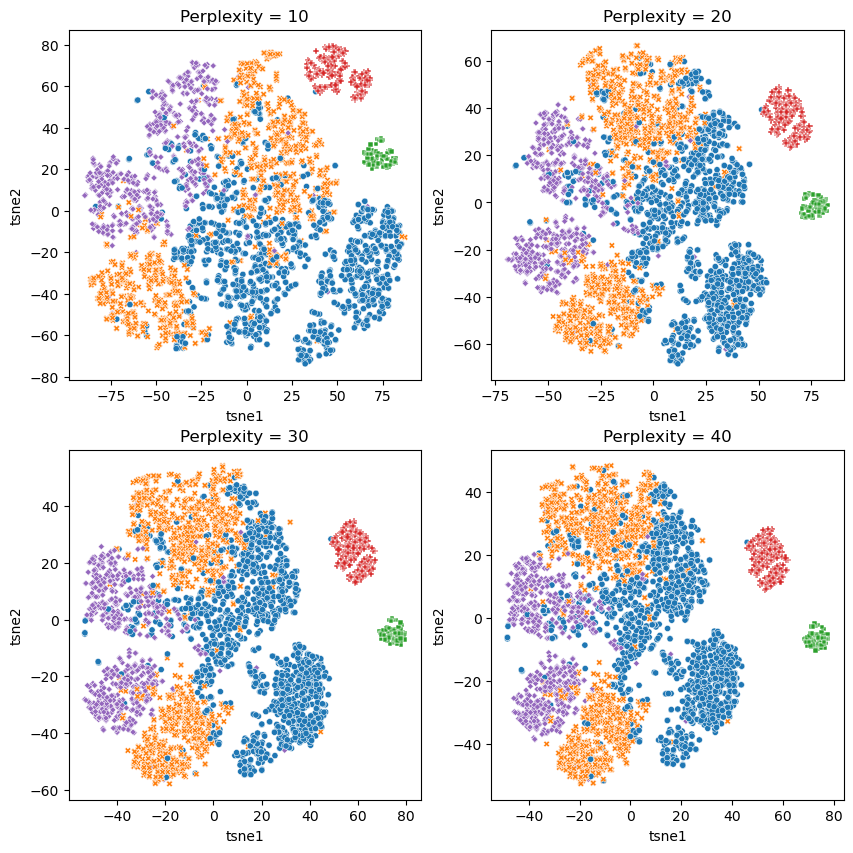

In [122]:
plt.figure(figsize=(10,10))
for index, p in enumerate([10, 20, 30, 40]):

    tsne2 = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results2 = tsne2.fit_transform(df)
    
    tsne_results2=pd.DataFrame(tsne_results2, columns=['tsne1', 'tsne2'])
    
    tsne_results2['cluster2'] = pd.Categorical(labels2)
    
    plt.subplot(2,2,index+1)
    sns.scatterplot(data=tsne_results2, x='tsne1', y='tsne2', 
                    hue="cluster2", style="cluster2", s=20)
    plt.title('Perplexity = '+ str(p))
    plt.legend([],[], frameon=False)
plt.show()

<h2 id="pattern_visualization">Análisis de matriz con K=4 y las variables descriptivas </h2>

In [123]:
matriz['cluster']=labels1.astype('object')
matriz

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,5,0,2,4,4,4,5,2,0
1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,...,2,4,1,5,5,4,5,3,2,1
2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,3,9,0,3,5,4,5,3,4,0
3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,...,3,3,2,2,4,4,4,5,2,1
4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,3,1,1,5,5,5,5,3,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,2018,Otro,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,9,0,1,5,1,1,4,1,0
3822,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,2,7,2,5,5,2,2,4,2,1
3823,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,1,6,3,4,4,4,5,3,2,1
3824,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,5,1,3,4,4,4,4,2,1


In [124]:
matriz.dtypes

FechaLlegaEC           object
Transporte             object
etnia                  object
DejarFamiliares        object
EntradaRegular         object
DocsResidencia         object
AccesoASalud           object
ViviendaTipo           object
agua                   object
sanitario              object
nacionalidad           object
Q1:grupotam             int64
Q2:Menores              int64
Q3:Escuela              int64
Q4:IncidentePais        int64
Q5:RiesgosSum           int64
Q6:DocsSiNo             int64
Q7:AplicaRefugio        int64
Q8:Electricidad         int64
Q9:Alimentacion         int64
Q10:MedidasAfronta      int64
Q11:MedidasExtremas     int64
Q12:Riesgos             int64
Q13:SentirSeguro        int64
Q14:Aislamiento         int64
Q15:Discriminacion      int64
Q16:Interaccion         int64
Q17:Internet            int64
cluster                object
dtype: object

<h4 id="pattern_visualization">A) Variables descriptivas</h4>

In [125]:
@ipywidgets.interact
def plot(col=matriz.select_dtypes(include = 'object').columns,
         hue=matriz.select_dtypes(include = 'object').columns,
        ):          # categorical univariate plot
    sns.reset_defaults()
    plt.figure(figsize=(12,2))
    sns.countplot(x=col, hue=hue, data=matriz);
    plt.show()

interactive(children=(Dropdown(description='col', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFamili…

<h4 id="pattern_visualization">B) Variables Matriz vs Descriptiva (Boxplot/Violin/Lineplot)</h4>

In [126]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns,
         hue=matriz.select_dtypes(include = 'object').columns,
         tplot=["boxplot", "lineplot", "violin"]
        ):
    palette = sns.color_palette("Set2", 12)
    sns.reset_defaults()
    plt.figure(figsize=(8,6))
    if tplot == "boxplot":
        sns.boxplot(data=matriz, x=var_x, y=var_y, hue=hue, palette=palette);
    if tplot == "violin":
        sns.violinplot(data=matriz, x=var_x, y=var_y, hue=hue, palette=palette, inner="quartil");
    else:
        sns.lineplot(data=matriz, x=var_x, y=var_y, hue=hue,
                     err_style="bars", ci=68, estimator='mean', palette=palette)
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

In [127]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns):
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
    palette = sns.color_palette("Set2", 12)
    g = sns.FacetGrid(matriz, palette=palette, row=var_x, hue=var_x, aspect=6, height=3)
    g.map_dataframe(sns.kdeplot, x=var_y, cut=0, fill=True, alpha=1)
    g.map_dataframe(sns.kdeplot, x=var_y, cut=0, color='black')
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .1, label, color='black', fontsize=13,
                ha="left", va="center", transform=ax.transAxes)
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

In [128]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns,
         hue_var=matriz.select_dtypes(include = 'object').columns):
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
    palette = sns.color_palette("Set2", 12)
    g = sns.FacetGrid(matriz, palette=palette, row=var_x, hue=hue_var, aspect=6, height=1.5)
    g.map_dataframe(sns.kdeplot, x=var_y, cut=0, fill=True, alpha=0.5)
    #g.map_dataframe(sns.kdeplot, x=var_y, cut=0, color='black', alpha=0.5)
    g.add_legend()
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

In [129]:
@ipywidgets.interact
def plot(var=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns):

    cw = 3

    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
    palette = sns.color_palette("Set2", 12)
    g = sns.FacetGrid(matriz, palette=palette, col=var, hue=var, col_wrap=cw, sharex=False, height=4)
    #g.map_dataframe(sns.histplot, x="value", bins=3, fill=True, alpha=1, kde=False)
    g.map_dataframe(sns.countplot, x=var_y)
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .2, label, color='black', fontsize=0,
                ha="left", va="center", transform=ax.transAxes)

    g.map(label, var)
    g.fig.subplots_adjust(hspace=0.2)
    plt.show()

interactive(children=(Dropdown(description='var', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFamili…

In [130]:
def countplot(x, hue, **kwargs):
    sns.countplot(x=x, hue=hue,**kwargs)


@ipywidgets.interact
def plot(column_var=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns,
         hue_var=matriz.select_dtypes(include = 'object').columns
         ):

    cw = 3
    palette = sns.color_palette("Set2", 12)
    grid = sns.FacetGrid(data=matriz, col=column_var, col_wrap=cw, sharex=False, height=4)
    fig = grid.map(countplot, var_y, hue_var, palette=palette)
    fig.add_legend()
    plt.show()

interactive(children=(Dropdown(description='column_var', options=('FechaLlegaEC', 'Transporte', 'etnia', 'Deja…

<h2 id="pattern_visualization">Análisis de matriz con K=2 y las variables descriptivas </h2>

In [131]:
matriz['cluster']=labels.astype('object')
matriz

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,5,0,2,4,4,4,5,2,1
1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,...,2,4,1,5,5,4,5,3,2,0
2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,3,9,0,3,5,4,5,3,4,1
3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,...,3,3,2,2,4,4,4,5,2,0
4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,3,1,1,5,5,5,5,3,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,2018,Otro,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,9,0,1,5,1,1,4,1,1
3822,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,2,7,2,5,5,2,2,4,2,0
3823,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,1,6,3,4,4,4,5,3,2,0
3824,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,5,1,3,4,4,4,4,2,0


In [132]:
@ipywidgets.interact
def plot(col=matriz.select_dtypes(include = 'object').columns,
         hue=matriz.select_dtypes(include = 'object').columns,
        ):          # categorical univariate plot
    sns.reset_defaults()
    plt.figure(figsize=(12,2))
    sns.countplot(x=col, hue=hue, data=matriz);
    plt.show()

interactive(children=(Dropdown(description='col', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFamili…

In [133]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns,
         hue=matriz.select_dtypes(include = 'object').columns,
         tplot=["boxplot", "lineplot", "violin"]
        ):
    palette = sns.color_palette("Set2", 12)
    sns.reset_defaults()
    plt.figure(figsize=(8,6))
    if tplot == "boxplot":
        sns.boxplot(data=matriz, x=var_x, y=var_y, hue=hue, palette=palette);
    if tplot == "violin":
        sns.violinplot(data=matriz, x=var_x, y=var_y, hue=hue, palette=palette, inner="quartil");
    else:
        sns.lineplot(data=matriz, x=var_x, y=var_y, hue=hue,
                     err_style="bars", ci=68, estimator='mean', palette=palette)
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

In [134]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns):
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
    palette = sns.color_palette("Set2", 12)
    g = sns.FacetGrid(matriz, palette=palette, row=var_x, hue=var_x, aspect=6, height=3)
    g.map_dataframe(sns.kdeplot, x=var_y, cut=0, fill=True, alpha=1)
    g.map_dataframe(sns.kdeplot, x=var_y, cut=0, color='black')
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .1, label, color='black', fontsize=13,
                ha="left", va="center", transform=ax.transAxes)
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

In [135]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns,
         hue_var=matriz.select_dtypes(include = 'object').columns):
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
    palette = sns.color_palette("Set2", 12)
    g = sns.FacetGrid(matriz, palette=palette, row=var_x, hue=hue_var, aspect=6, height=1.5)
    g.map_dataframe(sns.kdeplot, x=var_y, cut=0, fill=True, alpha=0.5)
    #g.map_dataframe(sns.kdeplot, x=var_y, cut=0, color='black', alpha=0.5)
    g.add_legend()
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

In [136]:
@ipywidgets.interact
def plot(var=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns):

    cw = 3

    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
    palette = sns.color_palette("Set2", 12)
    g = sns.FacetGrid(matriz, palette=palette, col=var, hue=var, col_wrap=cw, sharex=False, height=4)
    #g.map_dataframe(sns.histplot, x="value", bins=3, fill=True, alpha=1, kde=False)
    g.map_dataframe(sns.countplot, x=var_y)
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .2, label, color='black', fontsize=0,
                ha="left", va="center", transform=ax.transAxes)

    g.map(label, var)
    g.fig.subplots_adjust(hspace=0.2)
    plt.show()

interactive(children=(Dropdown(description='var', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFamili…

<h2 id="pattern_visualization">Actualización de matriz quitando variables no útiles</h2>

In [137]:
df

,grupotam,TotalMenores,Escuela_NoAsiste,IncidentePaisSiNo,RiesgosSum,DocsSiNo,AplicaRefugioSiNo,Electricidad,ComidasDiarias,MedidasAfrontaSum,MedidasExtremasSum,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet
0,-0.401426,-0.426639,-0.344588,-0.464917,-1.044768,0.252318,0.643753,0.159569,-0.434657,-0.192503,-0.616692,-1.445476,0.235341,0.662166,0.789846,1.861529,-0.416433
1,-0.401426,0.410448,-0.344588,-0.464917,0.767894,0.252318,0.643753,0.159569,-0.434657,-0.573132,0.708106,1.171016,1.173274,0.662166,1.570107,-0.939183,-0.416433
2,0.725808,0.410448,-0.344588,-0.464917,-1.044768,0.252318,-1.553391,0.159569,1.221715,1.330012,-0.616692,-0.573312,1.173274,0.662166,1.570107,-0.939183,1.291256
3,1.289425,0.410448,-0.344588,2.150923,-1.044768,0.252318,0.643753,0.159569,1.221715,-0.953761,2.032903,-1.445476,0.235341,0.662166,0.789846,1.861529,-0.416433
4,0.725808,1.247535,-0.344588,2.150923,-0.319703,0.252318,0.643753,0.159569,1.221715,-1.715018,0.708106,1.171016,1.173274,1.479670,1.570107,-0.939183,-0.416433
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,-0.401426,-0.426639,-0.344588,-0.464917,-1.044768,0.252318,0.643753,0.159569,-0.434657,1.330012,-0.616692,-2.317640,1.173274,-1.790347,-1.550937,0.461173,-1.270278
3822,1.289425,2.084622,1.403943,-0.464917,0.767894,0.252318,0.643753,0.159569,-0.434657,0.568755,2.032903,1.171016,1.173274,-0.972843,-0.770676,0.461173,-0.416433
3823,-0.401426,-0.426639,-0.344588,-0.464917,2.218024,0.252318,0.643753,0.159569,-2.091028,0.188126,3.357701,0.298852,0.235341,0.662166,1.570107,-0.939183,-0.416433
3824,-0.401426,0.410448,3.152473,-0.464917,-1.044768,0.252318,0.643753,0.159569,-0.434657,-0.192503,0.708106,-0.573312,0.235341,0.662166,0.789846,0.461173,-0.416433


In [138]:
df = df.drop('AplicaRefugioSiNo',axis=1)
df = df.drop('Electricidad',axis=1)
df

,grupotam,TotalMenores,Escuela_NoAsiste,IncidentePaisSiNo,RiesgosSum,DocsSiNo,ComidasDiarias,MedidasAfrontaSum,MedidasExtremasSum,RiesgoSiNo,SentirSeguro,Aislamiento,Discriminacion,Interaccion,Internet
0,-0.401426,-0.426639,-0.344588,-0.464917,-1.044768,0.252318,-0.434657,-0.192503,-0.616692,-1.445476,0.235341,0.662166,0.789846,1.861529,-0.416433
1,-0.401426,0.410448,-0.344588,-0.464917,0.767894,0.252318,-0.434657,-0.573132,0.708106,1.171016,1.173274,0.662166,1.570107,-0.939183,-0.416433
2,0.725808,0.410448,-0.344588,-0.464917,-1.044768,0.252318,1.221715,1.330012,-0.616692,-0.573312,1.173274,0.662166,1.570107,-0.939183,1.291256
3,1.289425,0.410448,-0.344588,2.150923,-1.044768,0.252318,1.221715,-0.953761,2.032903,-1.445476,0.235341,0.662166,0.789846,1.861529,-0.416433
4,0.725808,1.247535,-0.344588,2.150923,-0.319703,0.252318,1.221715,-1.715018,0.708106,1.171016,1.173274,1.479670,1.570107,-0.939183,-0.416433
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,-0.401426,-0.426639,-0.344588,-0.464917,-1.044768,0.252318,-0.434657,1.330012,-0.616692,-2.317640,1.173274,-1.790347,-1.550937,0.461173,-1.270278
3822,1.289425,2.084622,1.403943,-0.464917,0.767894,0.252318,-0.434657,0.568755,2.032903,1.171016,1.173274,-0.972843,-0.770676,0.461173,-0.416433
3823,-0.401426,-0.426639,-0.344588,-0.464917,2.218024,0.252318,-2.091028,0.188126,3.357701,0.298852,0.235341,0.662166,1.570107,-0.939183,-0.416433
3824,-0.401426,0.410448,3.152473,-0.464917,-1.044768,0.252318,-0.434657,-0.192503,0.708106,-0.573312,0.235341,0.662166,0.789846,0.461173,-0.416433


In [139]:
#***CLUSTER JERARQUICO ACTUALIZADO(K=4)****
hierarchical_cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
labels3 = hierarchical_cluster.fit_predict(df)
labels3

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

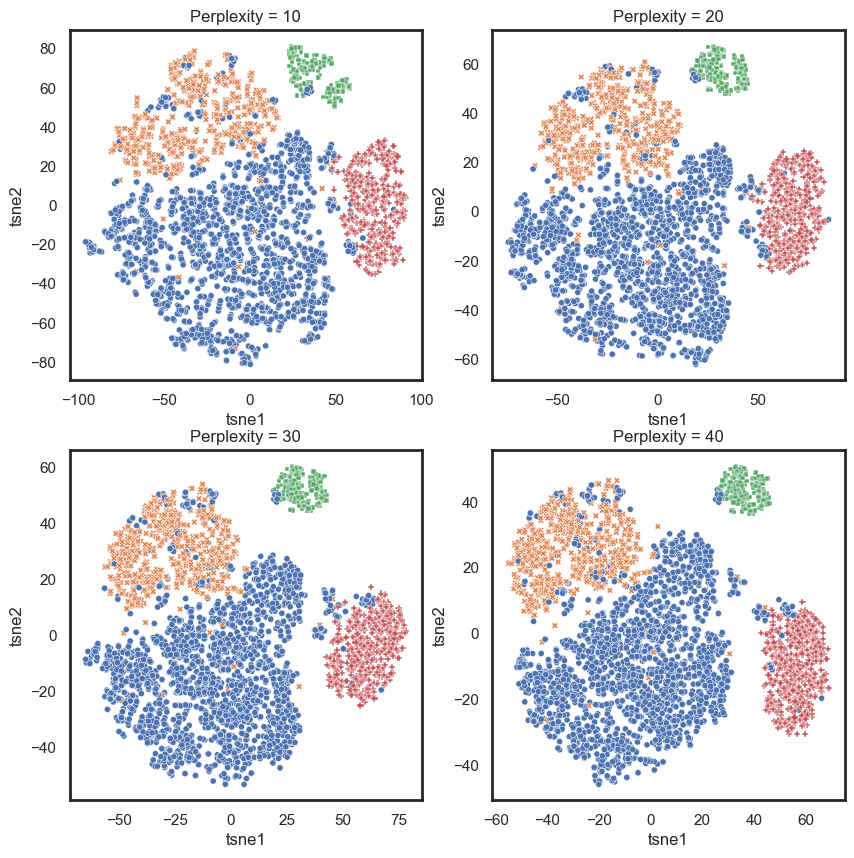

In [140]:
plt.figure(figsize=(10,10))
for index, p in enumerate([10, 20, 30, 40]):

    tsne3 = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results3 = tsne3.fit_transform(df)
    
    tsne_results3=pd.DataFrame(tsne_results3, columns=['tsne1', 'tsne2'])
    
    tsne_results3['cluster3'] = pd.Categorical(labels3)
    
    plt.subplot(2,2,index+1)
    sns.scatterplot(data=tsne_results3, x='tsne1', y='tsne2', 
                    hue="cluster3", style="cluster3", s=20)
    plt.title('Perplexity = '+ str(p))
    plt.legend([],[], frameon=False)
plt.show()

In [141]:
#***CLUSTER JERARQUICO ACTUALIZADO(K=2)****
hierarchical_cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
labels4 = hierarchical_cluster.fit_predict(df)
labels4

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

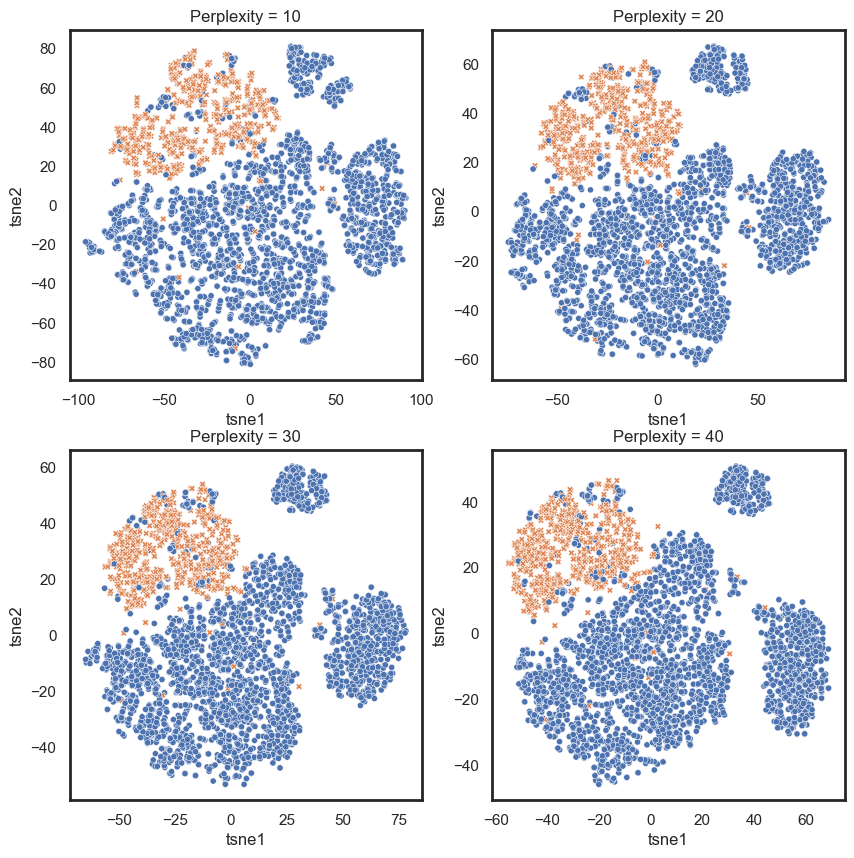

In [142]:
plt.figure(figsize=(10,10))
for index, p in enumerate([10, 20, 30, 40]):

    tsne4 = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results4 = tsne4.fit_transform(df)
    
    tsne_results4=pd.DataFrame(tsne_results4, columns=['tsne1', 'tsne2'])
    
    tsne_results4['cluster4'] = pd.Categorical(labels4)
    
    plt.subplot(2,2,index+1)
    sns.scatterplot(data=tsne_results4, x='tsne1', y='tsne2', 
                    hue="cluster4", style="cluster4", s=20)
    plt.title('Perplexity = '+ str(p))
    plt.legend([],[], frameon=False)
plt.show()

In [143]:
#***CLUSTER JERARQUICO ACTUALIZADO(K=3)****
hierarchical_cluster = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
labels5 = hierarchical_cluster.fit_predict(df)
labels5

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

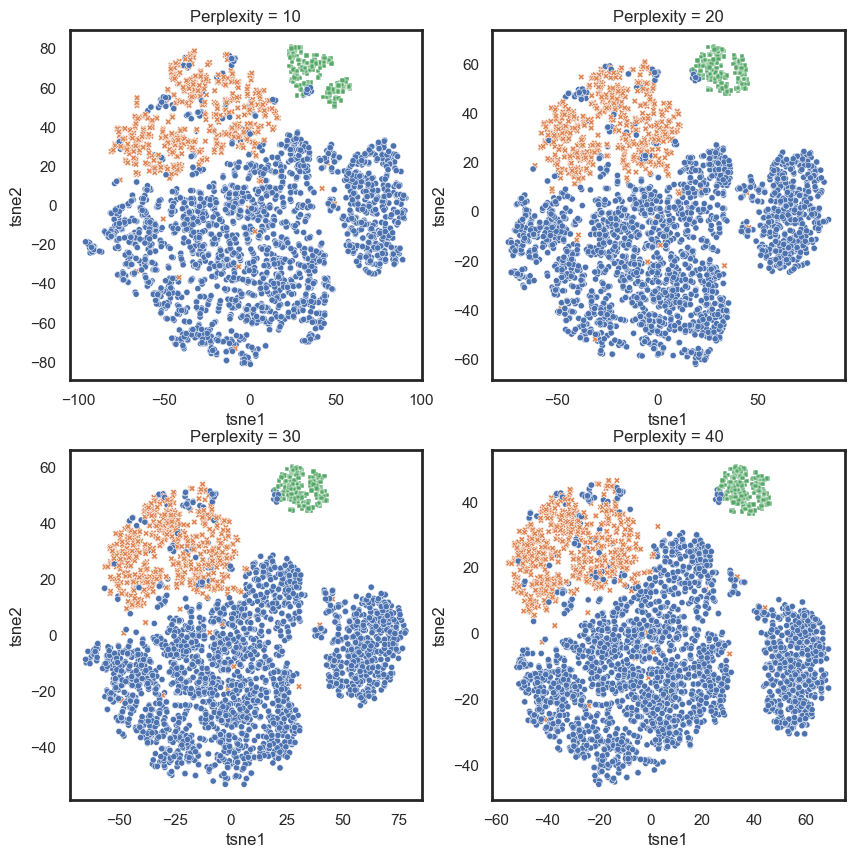

In [144]:
plt.figure(figsize=(10,10))
for index, p in enumerate([10, 20, 30, 40]):

    tsne5 = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results5 = tsne5.fit_transform(df)
    
    tsne_results5=pd.DataFrame(tsne_results5, columns=['tsne1', 'tsne2'])
    
    tsne_results5['cluster5'] = pd.Categorical(labels5)
    
    plt.subplot(2,2,index+1)
    sns.scatterplot(data=tsne_results5, x='tsne1', y='tsne2', 
                    hue="cluster5", style="cluster5", s=20)
    plt.title('Perplexity = '+ str(p))
    plt.legend([],[], frameon=False)
plt.show()

In [145]:
#***CLUSTER JERARQUICO ACTUALIZADO(K=5)****
hierarchical_cluster = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
labels6 = hierarchical_cluster.fit_predict(df)
labels6

array([4, 0, 0, ..., 0, 1, 0], dtype=int64)

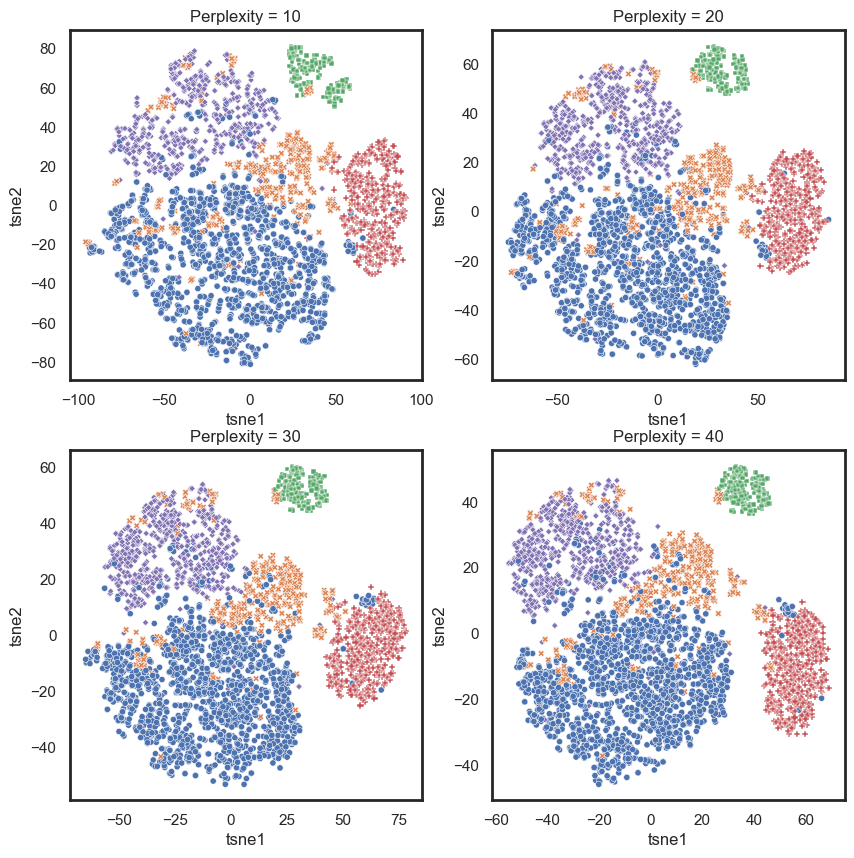

In [146]:
plt.figure(figsize=(10,10))
for index, p in enumerate([10, 20, 30, 40]):

    tsne6 = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results6 = tsne6.fit_transform(df)
    
    tsne_results6=pd.DataFrame(tsne_results6, columns=['tsne1', 'tsne2'])
    
    tsne_results6['cluster6'] = pd.Categorical(labels6)
    
    plt.subplot(2,2,index+1)
    sns.scatterplot(data=tsne_results6, x='tsne1', y='tsne2', 
                    hue="cluster6", style="cluster6", s=20)
    plt.title('Perplexity = '+ str(p))
    plt.legend([],[], frameon=False)
plt.show()

In [147]:
#***CLUSTER JERARQUICO ACTUALIZADO(K=6)****
hierarchical_cluster = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='ward')
labels7 = hierarchical_cluster.fit_predict(df)
labels7

array([4, 1, 1, ..., 1, 0, 1], dtype=int64)

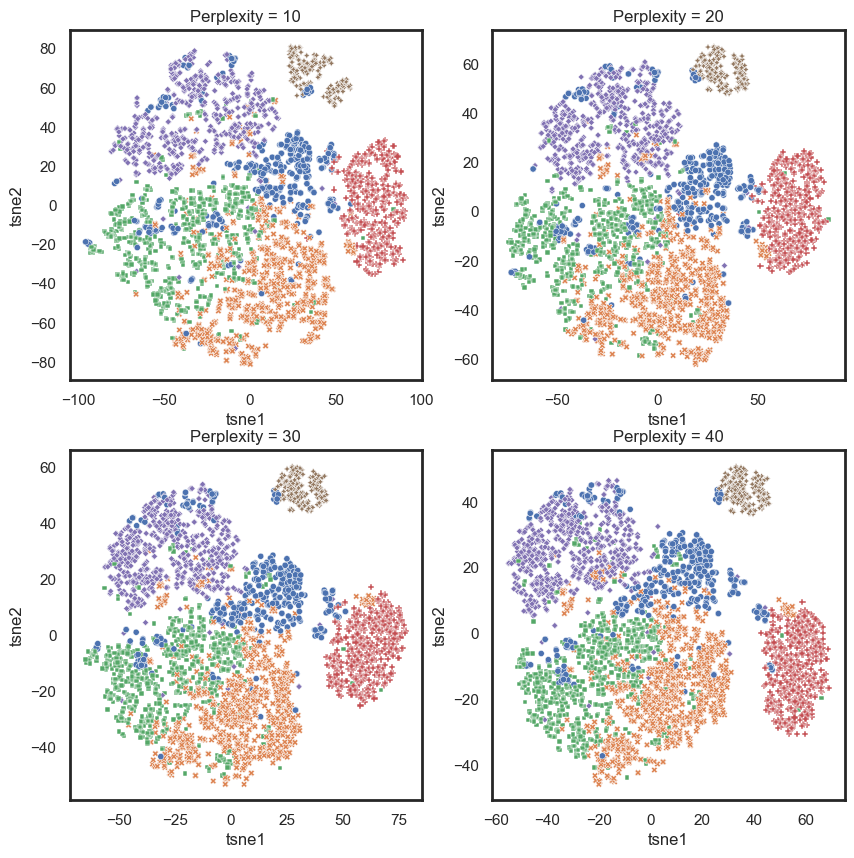

In [148]:
plt.figure(figsize=(10,10))
for index, p in enumerate([10, 20, 30, 40]):

    tsne7 = TSNE(n_components = 2, perplexity = p, random_state=0)
    tsne_results7 = tsne7.fit_transform(df)
    
    tsne_results7=pd.DataFrame(tsne_results7, columns=['tsne1', 'tsne2'])
    
    tsne_results7['cluster7'] = pd.Categorical(labels7)
    
    plt.subplot(2,2,index+1)
    sns.scatterplot(data=tsne_results7, x='tsne1', y='tsne2', 
                    hue="cluster7", style="cluster7", s=20)
    plt.title('Perplexity = '+ str(p))
    plt.legend([],[], frameon=False)
plt.show()

<h2 id="pattern_visualization">Análisis de matriz actualizada con K=5 y las variables descriptivas </h2>

In [149]:
matriz = matriz.drop('Q7:AplicaRefugio',axis=1)
matriz = matriz.drop('Q8:Electricidad',axis=1)
matriz['cluster']=labels6.astype('object')
matriz

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,5,0,2,4,4,4,5,2,4
1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,...,2,4,1,5,5,4,5,3,2,0
2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,3,9,0,3,5,4,5,3,4,0
3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,...,3,3,2,2,4,4,4,5,2,3
4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,3,1,1,5,5,5,5,3,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,2018,Otro,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,9,0,1,5,1,1,4,1,4
3822,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,2,7,2,5,5,2,2,4,2,1
3823,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,1,6,3,4,4,4,5,3,2,0
3824,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,5,1,3,4,4,4,4,2,1


In [150]:
@ipywidgets.interact
def plot(col=matriz.select_dtypes(include = 'object').columns,
         hue=matriz.select_dtypes(include = 'object').columns,
        ):          # categorical univariate plot
    sns.reset_defaults()
    plt.figure(figsize=(12,2))
    sns.countplot(x=col, hue=hue, data=matriz);
    plt.show()

interactive(children=(Dropdown(description='col', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFamili…

In [151]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns,
         hue=matriz.select_dtypes(include = 'object').columns,
         tplot=["boxplot", "lineplot", "violin"]
        ):
    palette = sns.color_palette("Set2", 12)
    sns.reset_defaults()
    plt.figure(figsize=(8,6))
    if tplot == "boxplot":
        sns.boxplot(data=matriz, x=var_x, y=var_y, hue=hue, palette=palette);
    if tplot == "violin":
        sns.violinplot(data=matriz, x=var_x, y=var_y, hue=hue, inner="quartil");
    else:
        sns.lineplot(data=matriz, x=var_x, y=var_y, hue=hue,
                     err_style="bars", ci=68, estimator='mean', palette=palette)
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

In [152]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns):
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
    palette = sns.color_palette("Set2", 12)
    g = sns.FacetGrid(matriz, palette=palette, row=var_x, hue=var_x, aspect=6, height=1.5)
    g.map_dataframe(sns.kdeplot, x=var_y, cut=0, fill=True, alpha=1)
    g.map_dataframe(sns.kdeplot, x=var_y, cut=0, color='black')
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .1, label, color='black', fontsize=13,
                ha="left", va="center", transform=ax.transAxes)
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

In [153]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns,
         hue_var=matriz.select_dtypes(include = 'object').columns):
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
    palette = sns.color_palette("Set2", 12)
    g = sns.FacetGrid(matriz, palette=palette, row=var_x, hue=hue_var, aspect=6, height=1.5)
    g.map_dataframe(sns.kdeplot, x=var_y, cut=0, fill=True, alpha=0.5)
    #g.map_dataframe(sns.kdeplot, x=var_y, cut=0, color='black', alpha=0.5)
    g.add_legend()
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

<h2 id="pattern_visualization">Análisis de matriz actualizada con K=4 y las variables descriptivas </h2>

In [154]:
matriz['cluster']=labels3.astype('object')
matriz

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,5,0,2,4,4,4,5,2,1
1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,...,2,4,1,5,5,4,5,3,2,0
2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,3,9,0,3,5,4,5,3,4,0
3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,...,3,3,2,2,4,4,4,5,2,3
4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,3,1,1,5,5,5,5,3,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,2018,Otro,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,9,0,1,5,1,1,4,1,1
3822,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,2,7,2,5,5,2,2,4,2,0
3823,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,1,6,3,4,4,4,5,3,2,0
3824,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,5,1,3,4,4,4,4,2,0


In [155]:
@ipywidgets.interact
def plot(col=matriz.select_dtypes(include = 'object').columns,
         hue=matriz.select_dtypes(include = 'object').columns,
        ):          # categorical univariate plot
    sns.reset_defaults()
    plt.figure(figsize=(12,2))
    sns.countplot(x=col, hue=hue, data=matriz);
    plt.show()

interactive(children=(Dropdown(description='col', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFamili…

In [156]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns,
         hue=matriz.select_dtypes(include = 'object').columns,
         tplot=["boxplot", "lineplot", "violin"]
        ):
    palette = sns.color_palette("Set2", 12)
    sns.reset_defaults()
    plt.figure(figsize=(8,6))
    if tplot == "boxplot":
        sns.boxplot(data=matriz, x=var_x, y=var_y, hue=hue, palette=palette);
    if tplot == "violin":
        sns.violinplot(data=matriz, x=var_x, y=var_y, hue=hue, inner="quartil");
    else:
        sns.lineplot(data=matriz, x=var_x, y=var_y, hue=hue,
                     err_style="bars", ci=68, estimator='mean', palette=palette)
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

<h2 id="pattern_visualization">Análisis de matriz actualizada con K=3 y las variables descriptivas </h2>

In [157]:
matriz['cluster']=labels5.astype('object')
matriz

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,5,0,2,4,4,4,5,2,1
1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,...,2,4,1,5,5,4,5,3,2,0
2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,3,9,0,3,5,4,5,3,4,0
3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,...,3,3,2,2,4,4,4,5,2,0
4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,3,1,1,5,5,5,5,3,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,2018,Otro,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,9,0,1,5,1,1,4,1,1
3822,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,2,7,2,5,5,2,2,4,2,0
3823,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,1,6,3,4,4,4,5,3,2,0
3824,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,5,1,3,4,4,4,4,2,0


In [158]:
@ipywidgets.interact
def plot(col=matriz.select_dtypes(include = 'object').columns,
         hue=matriz.select_dtypes(include = 'object').columns,
        ):          # categorical univariate plot
    sns.reset_defaults()
    plt.figure(figsize=(12,2))
    sns.countplot(x=col, hue=hue, data=matriz);
    plt.show()

interactive(children=(Dropdown(description='col', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFamili…

In [159]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns,
         hue=matriz.select_dtypes(include = 'object').columns,
         tplot=["boxplot", "lineplot", "violin"]
        ):
    palette = sns.color_palette("Set2", 12)
    sns.reset_defaults()
    plt.figure(figsize=(8,6))
    if tplot == "boxplot":
        sns.boxplot(data=matriz, x=var_x, y=var_y, hue=hue, palette=palette);
    if tplot == "violin":
        sns.violinplot(data=matriz, x=var_x, y=var_y, hue=hue, inner="quartil");
    else:
        sns.lineplot(data=matriz, x=var_x, y=var_y, hue=hue,
                     err_style="bars", ci=68, estimator='mean', palette=palette)
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

In [160]:
@ipywidgets.interact
def plot(var_x=matriz.select_dtypes(include = 'object').columns,
         var_y=matriz.select_dtypes(include = 'int64').columns,
         hue_var=matriz.select_dtypes(include = 'object').columns):
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
    palette = sns.color_palette("Set2", 12)
    g = sns.FacetGrid(matriz, palette=palette, row=var_x, hue=hue_var, aspect=6, height=1.5)
    g.map_dataframe(sns.kdeplot, x=var_y, cut=0, fill=True, alpha=0.5)
    #g.map_dataframe(sns.kdeplot, x=var_y, cut=0, color='black', alpha=0.5)
    g.add_legend()
    plt.show()

interactive(children=(Dropdown(description='var_x', options=('FechaLlegaEC', 'Transporte', 'etnia', 'DejarFami…

<h2 id="pattern_visualization">Análisis exploratorio </h2>

In [161]:
matriz['cluster']=labels3.astype('object')
matriz

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,5,0,2,4,4,4,5,2,1
1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,...,2,4,1,5,5,4,5,3,2,0
2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,3,9,0,3,5,4,5,3,4,0
3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,...,3,3,2,2,4,4,4,5,2,3
4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,3,1,1,5,5,5,5,3,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,2018,Otro,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,9,0,1,5,1,1,4,1,1
3822,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,2,7,2,5,5,2,2,4,2,0
3823,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,1,6,3,4,4,4,5,3,2,0
3824,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,5,1,3,4,4,4,4,2,0


In [162]:
matriz.describe()

,Q1:grupotam,Q2:Menores,Q3:Escuela,Q4:IncidentePais,Q5:RiesgosSum,Q6:DocsSiNo,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet
count,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000,3826.000000
mean,3.712232,1.509671,0.197073,0.177731,2.881861,0.940146,2.262415,5.505750,0.465499,3.657344,3.749085,3.190016,2.987716,3.670674,2.487716
std,1.774486,1.194775,0.571984,0.382336,2.758734,0.237246,0.603808,2.627575,0.754931,1.146724,1.066314,1.223395,1.281790,0.714198,1.171327
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2.000000,4.000000,0.000000,3.000000,4.000000,2.000000,2.000000,3.000000,2.000000
50%,4.000000,1.000000,0.000000,0.000000,2.000000,1.000000,2.000000,6.000000,0.000000,4.000000,4.000000,4.000000,3.000000,4.000000,2.000000
75%,5.000000,2.000000,0.000000,0.000000,4.000000,1.000000,3.000000,7.000000,1.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000
max,14.000000,7.000000,6.000000,1.000000,11.000000,1.000000,3.000000,12.000000,4.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [163]:
matriz

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,5,0,2,4,4,4,5,2,1
1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,...,2,4,1,5,5,4,5,3,2,0
2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,3,9,0,3,5,4,5,3,4,0
3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,...,3,3,2,2,4,4,4,5,2,3
4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,3,1,1,5,5,5,5,3,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3821,2018,Otro,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,9,0,1,5,1,1,4,1,1
3822,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,2,7,2,5,5,2,2,4,2,0
3823,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,1,6,3,4,4,4,5,3,2,0
3824,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,5,1,3,4,4,4,4,2,0


<h4 id="pattern_visualization">Gráfico de barras Transporte vs. entrada regular </h4>

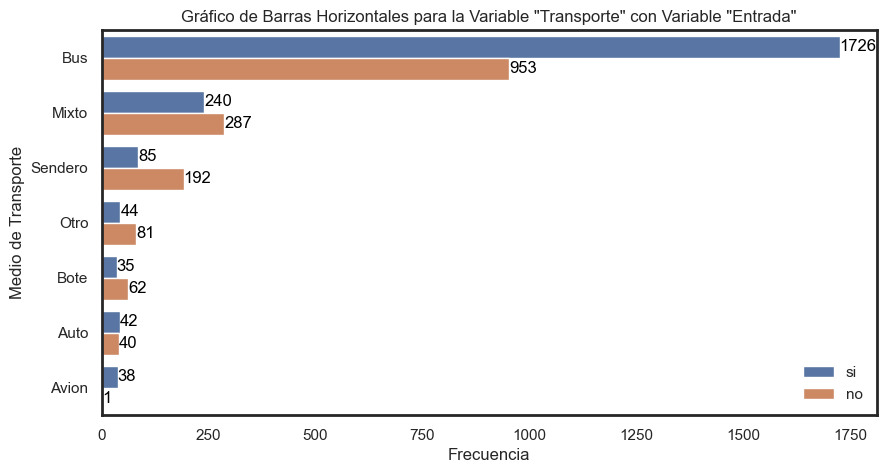

In [202]:
# Ordenar el DataFrame por la columna 'transporte' en orden alfabético
matriz_sorted = matriz.sort_values(by='Transporte')

# Crear un gráfico de barras horizontales con la variable 'Entrada' como hue
plt.figure(figsize=(10, 5))
ax=sns.countplot(y='Transporte', data=matriz_sorted, hue='EntradaRegular', order=matriz_sorted['Transporte'].value_counts().index)
ax.legend( frameon=False)
plt.xlabel('Frecuencia')
plt.ylabel('Medio de Transporte')
plt.title('Gráfico de Barras Horizontales para la Variable "Transporte" con Variable "Entrada"')

# Agregar valores a las barras
for p in ax.patches:
    width = p.get_width()
    ax.text(width, p.get_y() + p.get_height() / 2., f'{int(width)}', ha='left', va='center',color='black')

plt.show()

<h4 id="pattern_visualization">Mapa de calor Alimentacion vs. tamaño familiar </h4>

In [165]:
# Define un diccionario de mapeo de valores numéricos a etiquetas de texto
mapeo_alimentacion = {
    0: 'ninguna',
    1: 'Una o menos',
    2: 'Dos',
    3: 'Tres o más'
}
Alimentacion_Mapeo = matriz['Q9:Alimentacion'].replace(mapeo_alimentacion)
# Aplica el reemplazo a la variable 'Q9:Alimentacion'
#matriz['Q9:Alimentacion'] = matriz['Q9:Alimentacion'].replace(mapeo_alimentacion)

In [166]:
Alimentacion_Mapeo

0               Dos
1               Dos
2        Tres o más
3        Tres o más
4        Tres o más
           ...     
3821            Dos
3822            Dos
3823    Una o menos
3824            Dos
3825            Dos
Name: Q9:Alimentacion, Length: 3826, dtype: object

In [167]:
g=matriz[['Q1:grupotam']]

In [168]:
etiqueta = ['1', '2', '3', '4', '5', '6 o más']
colg = pd.cut(g['Q1:grupotam'], bins=[0, 1, 2, 3, 4, 5, 25], labels = etiqueta)

In [169]:
ali = pd.crosstab(matriz['Q1:grupotam'], Alimentacion_Mapeo)
ali.plot(kind='bar', stacked=True)
print(ali)

Q9:Alimentacion  Dos  Tres o más  Una o menos  ninguna
Q1:grupotam                                           
1                175          94           65        1
2                342         191           47        1
3                572         328           68        2
4                471         355           61        0
5                330         205           25        1
6                159          87           14        0
7                 73          28           10        0
8                 27          19           11        0
9                 18           5            4        0
10                 8           6            2        0
11                 7           5            1        0
12                 1           0            1        0
13                 3           1            0        0
14                 0           1            0        1


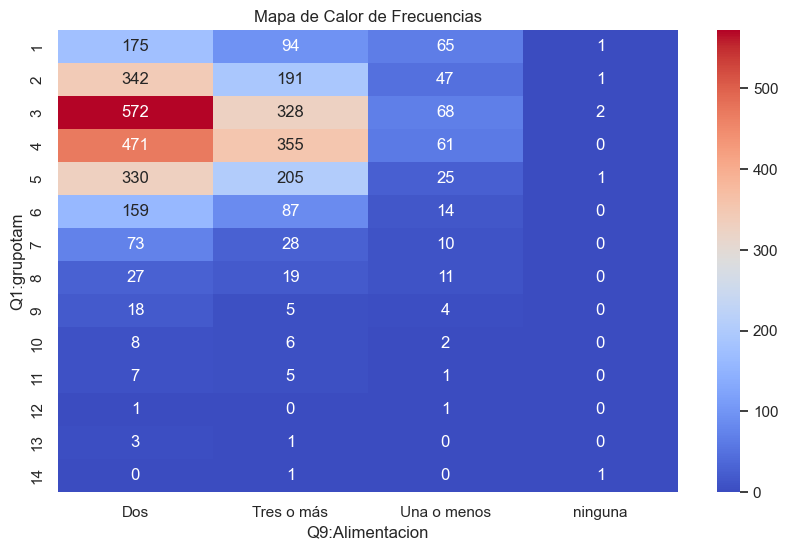

In [189]:
# Crear un mapa de calor a partir de la tabla de contingencia 'ali'
plt.figure(figsize=(10, 6))
sns.heatmap(ali, annot=True, fmt='d', cmap='coolwarm', cbar=True)

plt.xlabel('Q9:Alimentacion')
plt.ylabel('Q1:grupotam')
plt.title('Mapa de Calor de Frecuencias')

plt.show()

<h2 id="pattern_visualization">Resutados por clúster </h2>

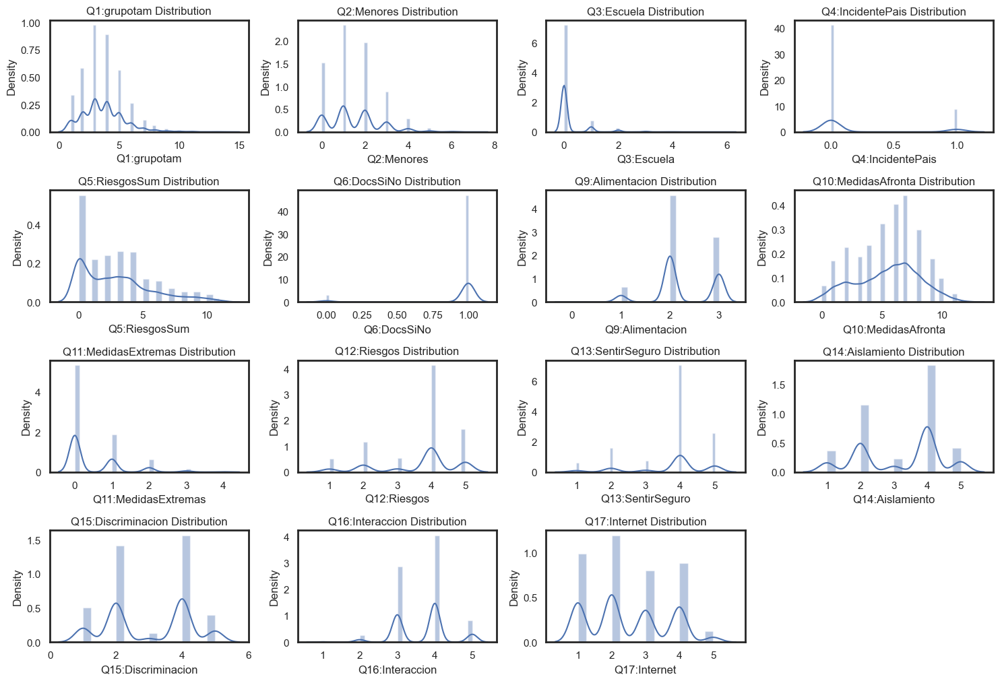

In [171]:
# Visualize the distribution of each variable.
plt.figure(figsize=(15,30))
for i, j in enumerate(matriz.describe().columns):
    plt.subplot(12,4, i+1)
    sns.distplot(x=matriz[j])
    plt.xlabel(j)
    plt.title('{} Distribution'.format(j))
    # plt.subplots_adjust(wspace=.2, hspace=.5)
    plt.tight_layout()
plt.show()

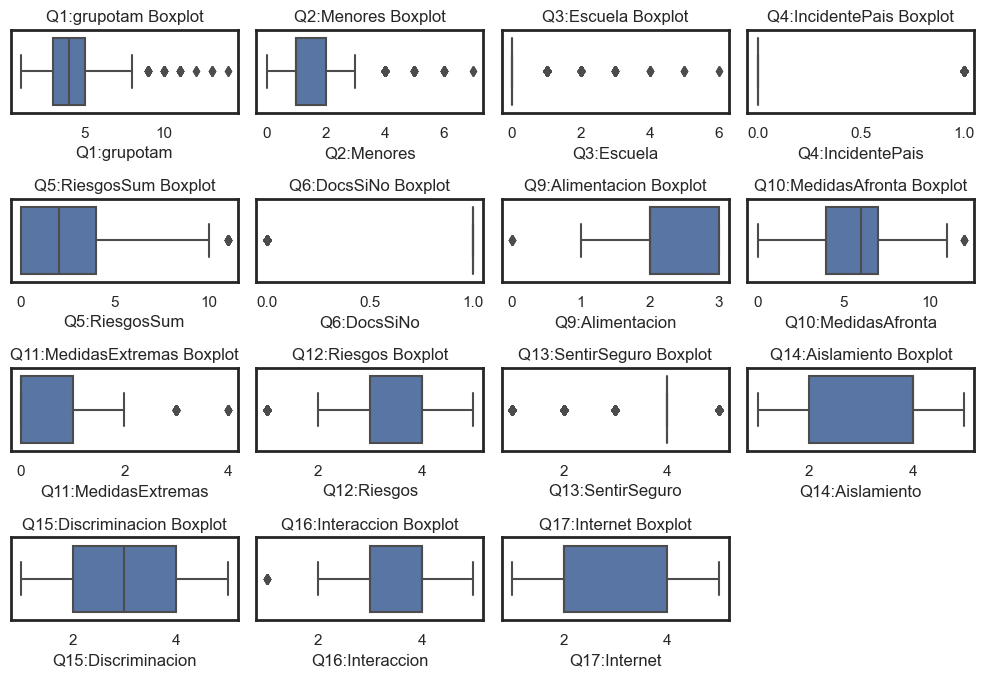

In [172]:
# Visualize the boxplot of each variable.
plt.figure(figsize=(10,20))
for i, j in enumerate(matriz.describe().columns):
    plt.subplot(12,4, i+1)
    sns.boxplot(x=matriz[j])
    plt.title('{} Boxplot'.format(j))
    plt.tight_layout()
    
plt.show()

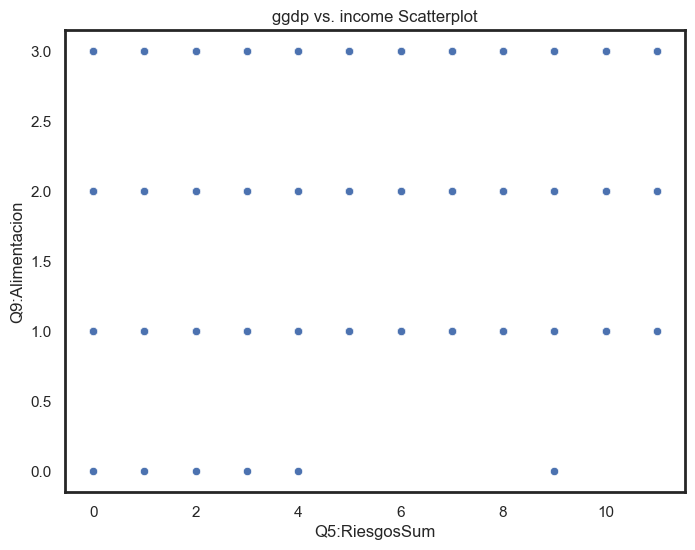

In [173]:
fig = plt.figure(figsize=(8,6))
sns.scatterplot(x=matriz['Q5:RiesgosSum'], y=matriz['Q9:Alimentacion'])
plt.title('ggdp vs. income Scatterplot')
plt.savefig('scatter.png')
plt.show()

In [174]:
print('Correlation between ggdp and income is : {}'.format(round(matriz.corr()['Q5:RiesgosSum']['Q9:Alimentacion'],3)))

Correlation between ggdp and income is : -0.089


In [175]:
matriz.corr()

,Q1:grupotam,Q2:Menores,Q3:Escuela,Q4:IncidentePais,Q5:RiesgosSum,Q6:DocsSiNo,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet
Q1:grupotam,1.000000,0.754572,0.113329,0.035715,0.059757,0.010620,0.030725,0.081686,0.004199,0.027589,-0.008740,-0.080301,-0.020635,-0.015799,-0.032203
Q2:Menores,0.754572,1.000000,0.199202,0.007110,0.034295,-0.027933,0.026198,0.084092,0.092253,0.041633,-0.015538,-0.019591,-0.034833,-0.011279,-0.090612
Q3:Escuela,0.113329,0.199202,1.000000,-0.028703,-0.023017,-0.065254,-0.032445,0.031427,0.110200,-0.044099,-0.004205,-0.003090,-0.006682,-0.036919,-0.052577
Q4:IncidentePais,0.035715,0.007110,-0.028703,1.000000,0.169374,-0.081565,-0.109217,0.171519,0.100957,0.106741,-0.225327,0.121170,0.193836,-0.160903,-0.093781
Q5:RiesgosSum,0.059757,0.034295,-0.023017,0.169374,1.000000,0.009166,-0.089051,0.270664,0.083027,0.514951,-0.210579,0.115875,0.183684,-0.150187,-0.083540
Q6:DocsSiNo,0.010620,-0.027933,-0.065254,-0.081565,0.009166,1.000000,0.000170,0.003698,-0.051674,0.019731,0.018127,-0.004942,0.003600,0.016331,0.042982
Q9:Alimentacion,0.030725,0.026198,-0.032445,-0.109217,-0.089051,0.000170,1.000000,-0.223574,-0.258873,-0.100804,0.146553,-0.169447,-0.157637,0.144071,0.271447
Q10:MedidasAfronta,0.081686,0.084092,0.031427,0.171519,0.270664,0.003698,-0.223574,1.000000,0.229757,0.056142,-0.130212,0.137391,0.161285,-0.151540,-0.231366
Q11:MedidasExtremas,0.004199,0.092253,0.110200,0.100957,0.083027,-0.051674,-0.258873,0.229757,1.000000,0.043267,-0.167945,0.156986,0.140458,-0.132603,-0.234046
Q12:Riesgos,0.027589,0.041633,-0.044099,0.106741,0.514951,0.019731,-0.100804,0.056142,0.043267,1.000000,-0.171464,0.168673,0.203994,-0.110689,-0.094713


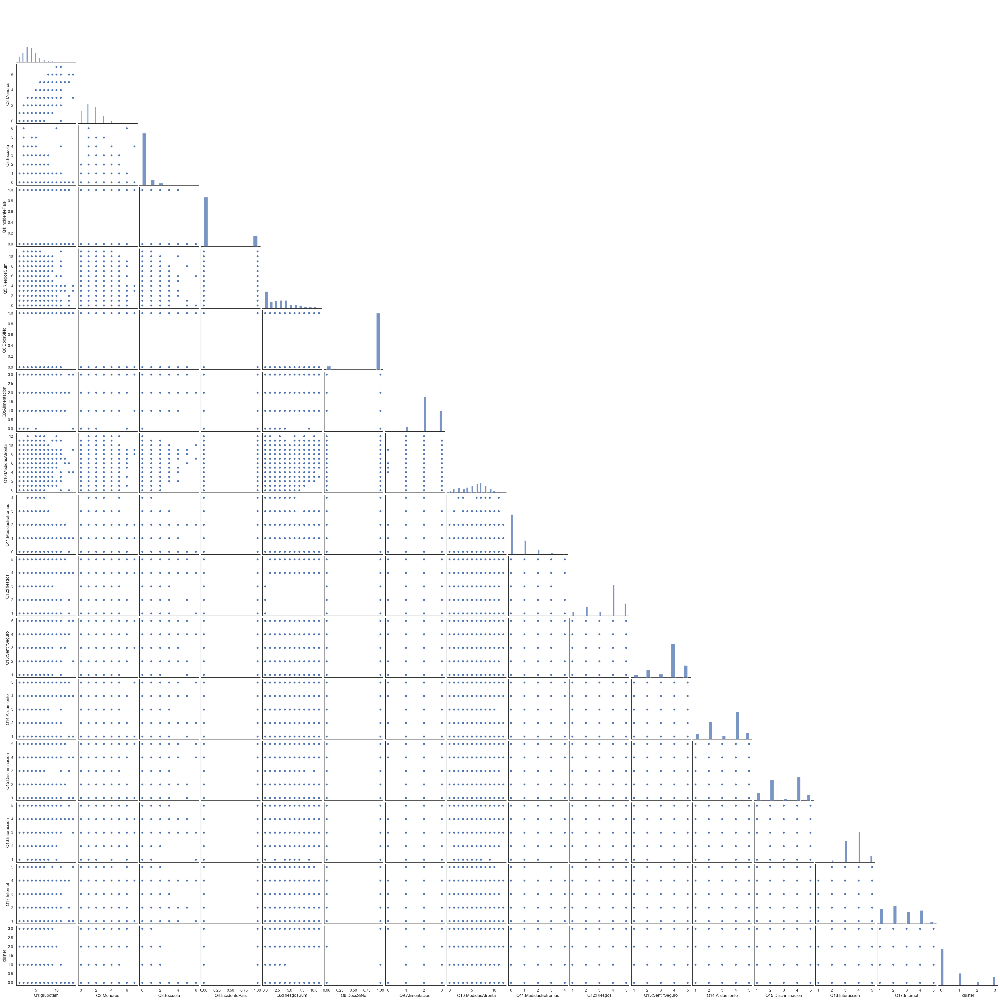

In [176]:
pairplot = sns.pairplot(matriz, corner=True)
plt.show(pairplot)

In [177]:
matriz_filtro_K0 = matriz[matriz.cluster == 0]
matriz_filtro_K0

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
1,2017 or earlier,Mixto,mixta,si,si,visaresidenciaperm,Publico,Rentadas,Filtrada,BanoPrivado,...,2,4,1,5,5,4,5,3,2,0
2,2018,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,3,9,0,3,5,4,5,3,4,0
5,2018,Bus,mixta,no,si,visahumanitaria,Publico,Compartidas,Filtrada,BanoPrivado,...,2,4,1,4,3,4,3,3,3,0
8,2021,Otro,indigena,no,no,irregular,Publico,Auspiciadas,Filtrada,Compartido,...,3,0,0,5,4,5,2,4,1,0
9,2019,Bus,mixta,si,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,3,8,1,5,1,4,4,4,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3820,2020,Mixto,mixta,si,si,irregular,NoNecesita,Compartidas,Filtrada,BanoPrivado,...,3,8,1,4,2,2,2,4,4,0
3822,2021,Otro,blanco,si,no,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,2,7,2,5,5,2,2,4,2,0
3823,2021,Bus,negro,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,1,6,3,4,4,4,5,3,2,0
3824,2020,Mixto,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,5,1,3,4,4,4,4,2,0


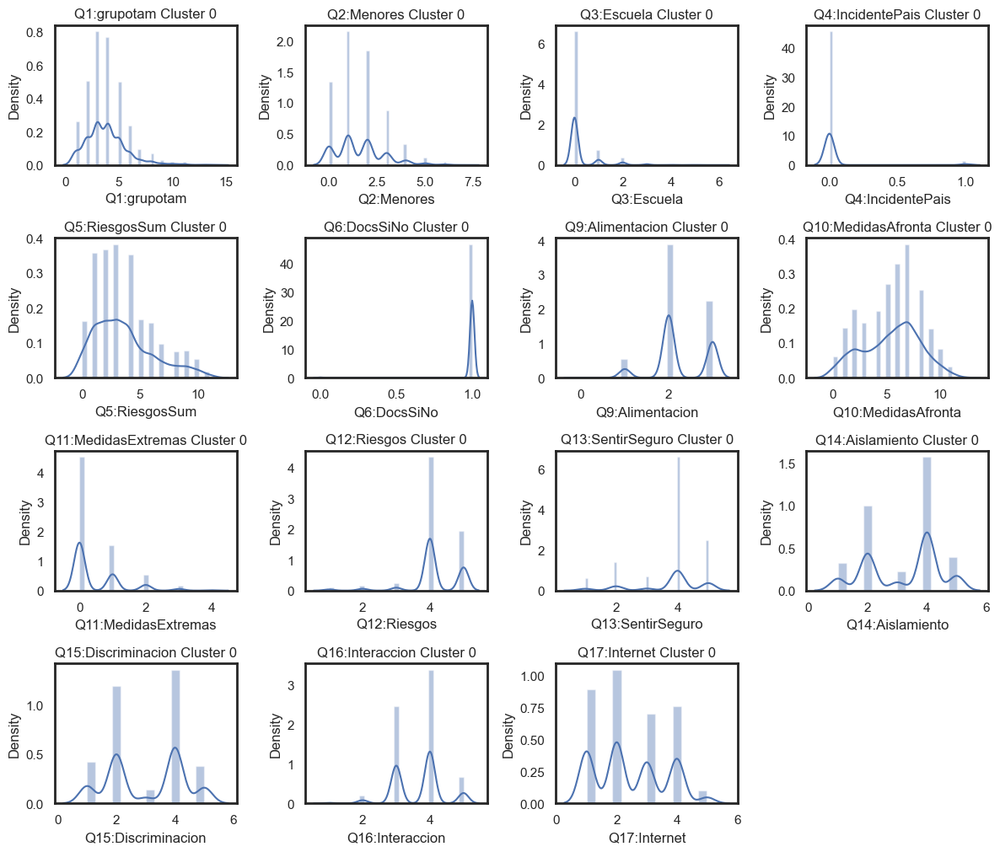

In [178]:
# Visualize the distribution of each variable.
plt.figure(figsize=(12,30))
for i, j in enumerate(matriz_filtro_K0.describe().columns):
    plt.subplot(12,4, i+1)
    sns.distplot(x=matriz_filtro_K0[j])
    plt.xlabel(j)
    plt.title('{} Cluster 0'.format(j))
    # plt.subplots_adjust(wspace=.2, hspace=.5)
    plt.tight_layout()
plt.show()

In [179]:
matriz_filtro_K1 = matriz[matriz.cluster == 1]
matriz_filtro_K1

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
0,2018,Bus,mixta,si,no,irregular,Publico,Rentadas,Filtrada,Compartido,...,2,5,0,2,4,4,4,5,2,1
6,2019,Bus,mixta,si,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,3,2,0,1,5,5,1,3,2,1
7,2019,Bus,otro,no,si,irregular,Publico,Rentadas,Botellones,BanoPrivado,...,3,7,0,2,4,2,2,4,3,1
18,2021,Bus,mixta,si,si,visaresidenciatemp,Publico,Auspiciadas,Filtrada,Compartido,...,2,7,1,3,4,2,2,4,3,1
42,2017 or earlier,Bus,blanco,no,no,visahumanitaria,Publico,Propios,AbasteceORG,BanoPrivado,...,2,4,0,3,5,1,1,4,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3797,2020,Bus,mixta,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,8,1,1,4,4,4,3,1,1
3803,2021,Bus,mixta,no,no,irregular,NoNecesita,Rentadas,Filtrada,BanoPrivado,...,3,1,0,2,4,2,2,4,2,1
3804,2017 or earlier,Bus,mixta,no,no,visahumanitaria,Publico,Compartidas,Filtrada,Compartido,...,2,3,0,3,5,5,1,3,4,1
3814,2020,Bus,mixta,no,no,irregular,NoNecesita,Rentadas,Botellones,BanoPrivado,...,3,1,0,2,3,3,4,3,2,1


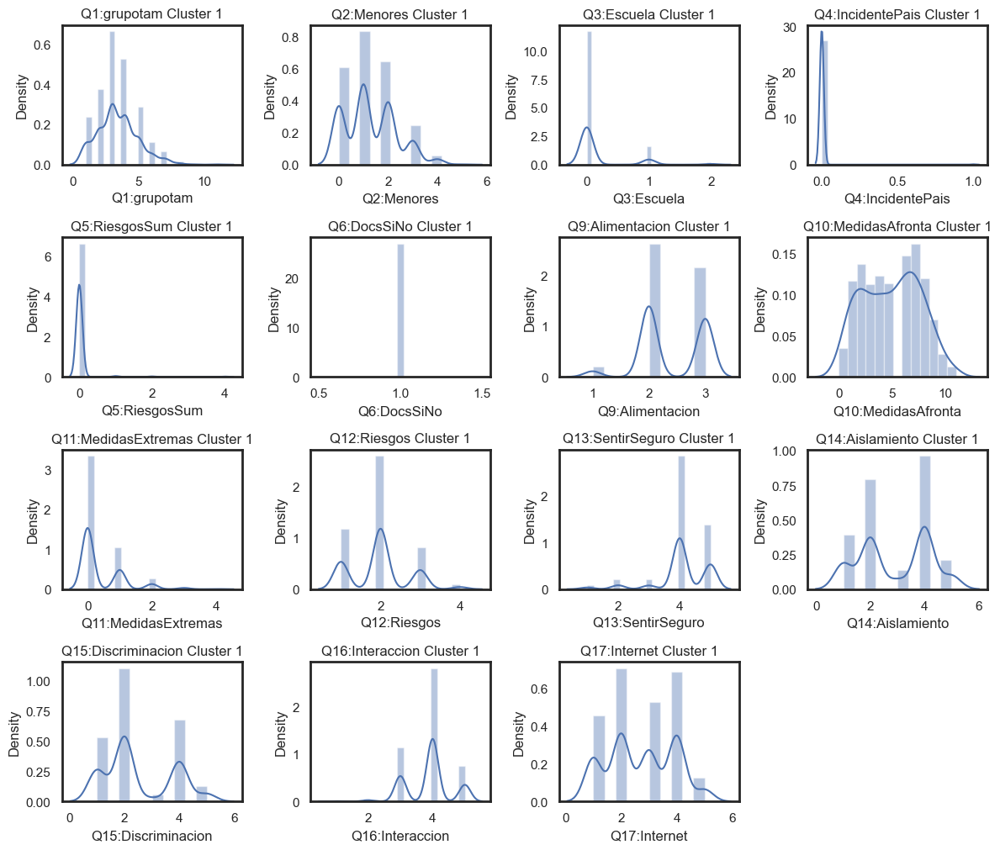

In [180]:
# Visualize the distribution of each variable.
plt.figure(figsize=(12,30))
for i, j in enumerate(matriz_filtro_K1.describe().columns):
    plt.subplot(12,4, i+1)
    sns.distplot(x=matriz_filtro_K1[j])
    plt.xlabel(j)
    plt.title('{} Cluster 1'.format(j))
    # plt.subplots_adjust(wspace=.2, hspace=.5)
    plt.tight_layout()
plt.show()

In [181]:
matriz_filtro_K2 = matriz[matriz.cluster == 2]
matriz_filtro_K2

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
23,2019,Bus,mixta,si,si,irregular,Publico,Rentadas,Filtrada,BanoPrivado,...,3,2,1,5,3,3,2,3,2,2
32,2021,Bus,mixta,si,no,irregular,NoFacilidad,Auspiciadas,AbasteceORG,BanoPrivado,...,3,1,1,4,4,2,4,4,4,2
36,2020,Bus,mixta,no,no,visapendiente,NoNecesita,Rentadas,Filtrada,BanoPrivado,...,2,4,0,4,4,2,3,3,2,2
50,2020,Auto,mixta,no,no,irregular,NoFacilidad,Compartidas,Filtrada,Compartido,...,2,6,0,4,4,4,4,4,2,2
53,2019,Bus,mixta,no,si,visapendiente,Publico,Rentadas,Filtrada,BanoPrivado,...,3,0,0,4,4,2,2,3,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3751,2020,Sendero,mixta,no,no,irregular,Publico,Auspiciadas,Filtrada,Compartido,...,1,8,3,2,4,4,2,4,1,2
3800,2019,Bus,mixta,no,no,irregular,Publico-Privado,Rentadas,Filtrada,BanoPrivado,...,3,6,0,4,4,2,2,4,1,2
3801,2019,Auto,mixta,si,si,visahumanitaria,Publico,Temporales,FuentesAgua,Compartido,...,2,12,0,5,3,2,2,5,2,2
3805,2020,Bus,mixta,si,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,9,0,4,2,4,4,4,1,2


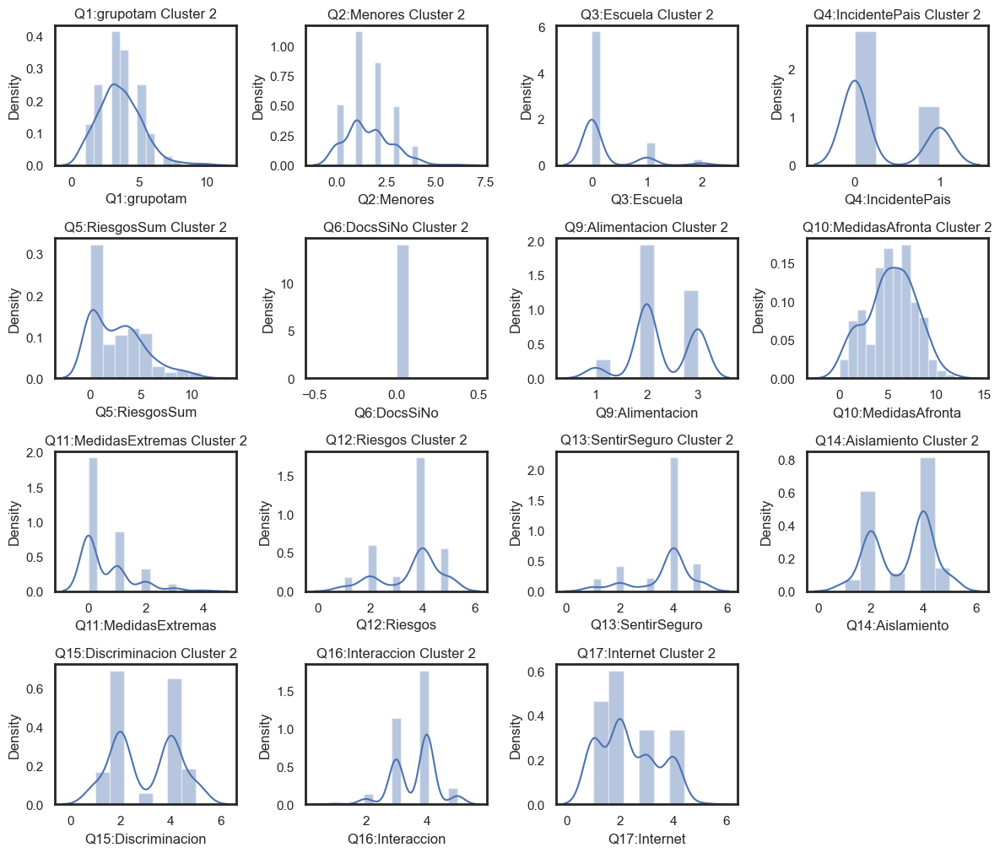

In [182]:
# Visualize the distribution of each variable.
plt.figure(figsize=(12,30))
for i, j in enumerate(matriz_filtro_K2.describe().columns):
    plt.subplot(12,4, i+1)
    sns.distplot(x=matriz_filtro_K2[j])
    plt.xlabel(j)
    plt.title('{} Cluster 2'.format(j))
    # plt.subplots_adjust(wspace=.2, hspace=.5)
    plt.tight_layout()
plt.show()

In [183]:
matriz_filtro_K3 = matriz[matriz.cluster == 3]
matriz_filtro_K3

,FechaLlegaEC,Transporte,etnia,DejarFamiliares,EntradaRegular,DocsResidencia,AccesoASalud,ViviendaTipo,agua,sanitario,...,Q9:Alimentacion,Q10:MedidasAfronta,Q11:MedidasExtremas,Q12:Riesgos,Q13:SentirSeguro,Q14:Aislamiento,Q15:Discriminacion,Q16:Interaccion,Q17:Internet,cluster
3,2018,Bus,otro,si,si,irregular,Publico,Rentadas,Botellones,Compartido,...,3,3,2,2,4,4,4,5,2,3
4,2017 or earlier,Bus,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,3,1,1,5,5,5,5,3,2,3
14,2018,Mixto,negro,no,si,visahumanitaria,Publico,Rentadas,Filtrada,BanoPrivado,...,2,11,2,2,2,4,4,3,1,3
17,2018,Sendero,mixta,si,si,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,7,0,4,4,2,2,3,4,3
30,2020,Bus,mixta,si,si,visaresidenciatemp,Publico,Rentadas,Potable,Compartido,...,2,5,0,4,2,4,4,3,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3806,2019,Bus,mixta,no,no,irregular,Publico,Compartidas,Filtrada,Compartido,...,2,7,0,5,3,3,4,3,1,3
3808,2017 or earlier,Bus,mixta,si,si,visaresidenciatemp,Privado,Rentadas,Filtrada,BanoPrivado,...,3,7,0,4,2,2,4,4,4,3
3810,2019,Bus,blanco,si,si,irregular,Publico,Compartidas,Filtrada,Externo,...,2,9,1,4,2,4,4,3,3,3
3817,2021,Bote,mixta,no,no,irregular,Publico,Compartidas,Filtrada,BanoPrivado,...,1,4,0,4,2,4,4,4,1,3


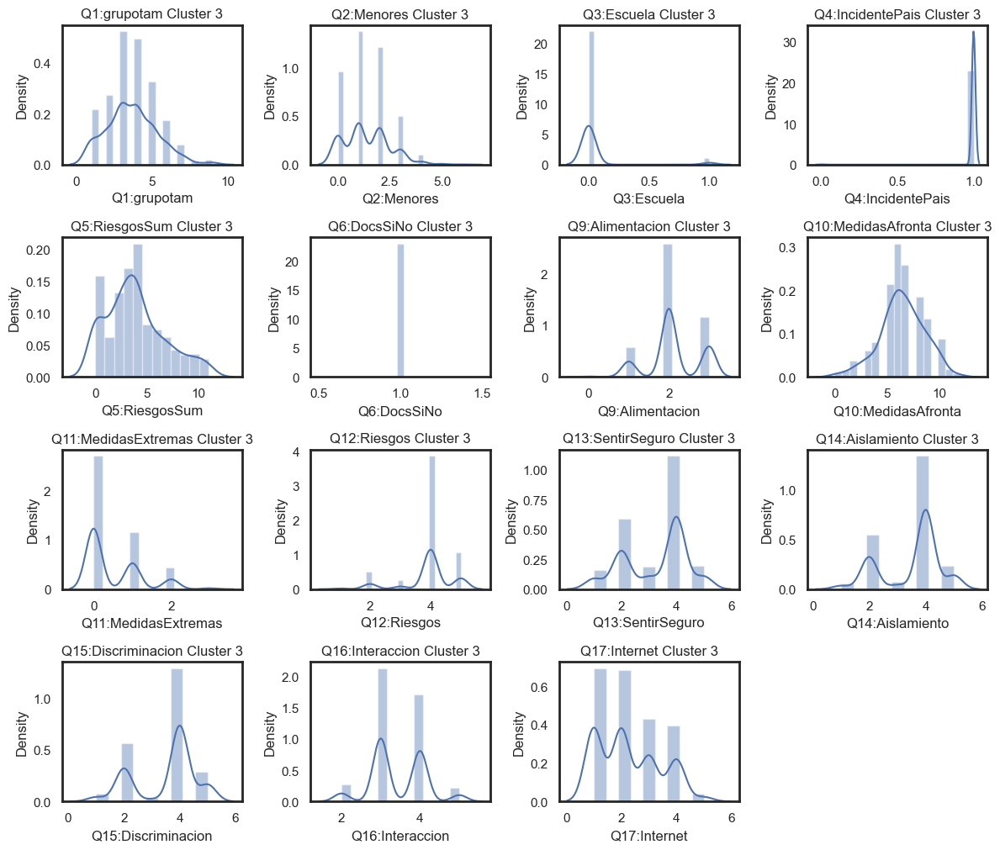

In [184]:
# Visualize the distribution of each variable.
plt.figure(figsize=(12,30))
for i, j in enumerate(matriz_filtro_K3.describe().columns):
    plt.subplot(12,4, i+1)
    sns.distplot(x=matriz_filtro_K3[j])
    plt.xlabel(j)
    plt.title('{} Cluster 3'.format(j))
    # plt.subplots_adjust(wspace=.2, hspace=.5)
    plt.tight_layout()
plt.show()